In [581]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import plotly.express as px
import seaborn as sns
import scipy.stats as stats
import datetime as dt
from ipywidgets import interact
from itertools import combinations
from collections import Counter

In [4]:
geo_location= pd.read_csv(r"C:\Users\hp\Downloads\Python Case Study\5. Python Foundation End to End Case Study_E-Commerce Analytics Project\GEO_LOCATION.csv")
order_payment= pd.read_csv(r"C:\Users\hp\Downloads\Python Case Study\5. Python Foundation End to End Case Study_E-Commerce Analytics Project\ORDER_PAYMENTS.csv")
rating_review= pd.read_csv(r"C:\Users\hp\Downloads\Python Case Study\5. Python Foundation End to End Case Study_E-Commerce Analytics Project\ORDER_REVIEW_RATINGS.csv")
order= pd.read_csv(r"C:\Users\hp\Downloads\Python Case Study\5. Python Foundation End to End Case Study_E-Commerce Analytics Project\ORDERS.csv")
product= pd.read_csv(r"C:\Users\hp\Downloads\Python Case Study\5. Python Foundation End to End Case Study_E-Commerce Analytics Project\PRODUCTS.csv")
seller= pd.read_csv(r"C:\Users\hp\Downloads\Python Case Study\5. Python Foundation End to End Case Study_E-Commerce Analytics Project\SELLERS.csv")
order_item=  pd.read_csv(r"C:\Users\hp\Downloads\Python Case Study\5. Python Foundation End to End Case Study_E-Commerce Analytics Project\ORDER_ITEMS.csv")
customers= pd.read_csv(r"C:\Users\hp\Downloads\Python Case Study\5. Python Foundation End to End Case Study_E-Commerce Analytics Project\CUSTOMERS.csv")

In [5]:
geo_location.head(3)

,geolocation_zip_code_prefix,geolocation_lat,geolocation_lng,geolocation_city,geolocation_state
0,1037,-23.545621,-46.639292,Akkarampalle,Andhra Pradesh
1,1046,-23.546081,-46.644820,Akkarampalle,Andhra Pradesh
2,1041,-23.544392,-46.639499,Akkarampalle,Andhra Pradesh


In [6]:
order_payment.head(3)

,order_id,payment_sequential,payment_type,payment_installments,payment_value
0,b81ef226f3fe1789b1e8b2acac839d17,1,credit_card,8,99.33
1,a9810da82917af2d9aefd1278f1dcfa0,1,credit_card,1,24.39
2,25e8ea4e93396b6fa0d3dd708e76c1bd,1,credit_card,1,65.71


In [7]:
rating_review.head(3)

,review_id,order_id,review_score,review_creation_date,review_answer_timestamp
0,7bc2406110b926393aa56f80a40eba40,73fc7af87114b39712e6da79b0a377eb,4,1/18/2018 0:00,1/18/2018 21:46
1,80e641a11e56f04c1ad469d5645fdfde,a548910a1c6147796b98fdf73dbeba33,5,3/10/2018 0:00,3/11/2018 3:05
2,228ce5500dc1d8e020d8d1322874b6f0,f9e4b658b201a9f2ecdecbb34bed034b,5,2/17/2018 0:00,2/18/2018 14:36


In [8]:
order.head(3)

,order_id,customer_id,order_status,order_purchase_timestamp,order_approved_at,order_delivered_carrier_date,order_delivered_customer_date,order_estimated_delivery_date
0,e481f51cbdc54678b7cc49136f2d6af7,9ef432eb6251297304e76186b10a928d,delivered,10/2/2017 10:56,10/2/2017 11:07,10/4/2017 19:55,10/10/2017 21:25,10/18/2017 0:00
1,53cdb2fc8bc7dce0b6741e2150273451,b0830fb4747a6c6d20dea0b8c802d7ef,delivered,7/24/2018 20:41,7/26/2018 3:24,7/26/2018 14:31,8/7/2018 15:27,8/13/2018 0:00
2,47770eb9100c2d0c44946d9cf07ec65d,41ce2a54c0b03bf3443c3d931a367089,delivered,8/8/2018 8:38,8/8/2018 8:55,8/8/2018 13:50,8/17/2018 18:06,9/4/2018 0:00


In [9]:
product.head(3)

,product_id,product_category_name,product_name_lenght,product_description_lenght,product_photos_qty,product_weight_g,product_length_cm,product_height_cm,product_width_cm
0,1e9e8ef04dbcff4541ed26657ea517e5,Perfumery,40.0,287.0,1.0,225.0,16.0,10.0,14.0
1,3aa071139cb16b67ca9e5dea641aaa2f,Art,44.0,276.0,1.0,1000.0,30.0,18.0,20.0
2,96bd76ec8810374ed1b65e291975717f,Sports_Leisure,46.0,250.0,1.0,154.0,18.0,9.0,15.0


In [10]:
seller.head(3)

,seller_id,seller_zip_code_prefix,seller_city,seller_state
0,3442f8959a84dea7ee197c632cb2df15,13023,Alwal,Andhra Pradesh
1,d1b65fc7debc3361ea86b5f14c68d2e2,13023,Alwal,Andhra Pradesh
2,ce3ad9de960102d0677a81f5d0bb7b2d,20031,Badepalle,Andhra Pradesh


In [11]:
order_item.head(3)

,order_id,order_item_id,product_id,seller_id,shipping_limit_date,price,freight_value
0,00010242fe8c5a6d1ba2dd792cb16214,1,4244733e06e7ecb4970a6e2683c13e61,48436dade18ac8b2bce089ec2a041202,9/19/2017 9:45,58.9,13.29
1,00018f77f2f0320c557190d7a144bdd3,1,e5f2d52b802189ee658865ca93d83a8f,dd7ddc04e1b6c2c614352b383efe2d36,5/3/2017 11:05,239.9,19.93
2,000229ec398224ef6ca0657da4fc703e,1,c777355d18b72b67abbeef9df44fd0fd,5b51032eddd242adc84c38acab88f23d,1/18/2018 14:48,199.0,17.87


In [12]:
customers.head(3)

,customer_id,customer_unique_id,customer_zip_code_prefix,customer_city,customer_state
0,06b8999e2fba1a1fbc88172c00ba8bc7,861eff4711a542e4b93843c6dd7febb0,14409,Adilabad,Andhra Pradesh
1,18955e83d337fd6b2def6b18a428ac77,290c77bc529b7ac935b93aa66c333dc3,9790,Adoni,Andhra Pradesh
2,4e7b3e00288586ebd08712fdd0374a03,060e732b5b29e8181a18229c7b0b2b5e,1151,Akkarampalle,Andhra Pradesh


## **DATA CLEANING**

### Order DataSet:

In [15]:
order.columns

Index(['order_id', 'customer_id', 'order_status', 'order_purchase_timestamp',
       'order_approved_at', 'order_delivered_carrier_date',
       'order_delivered_customer_date', 'order_estimated_delivery_date'],
      dtype='object')

In [16]:
order.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 99441 entries, 0 to 99440
Data columns (total 8 columns):
 #   Column                         Non-Null Count  Dtype 
---  ------                         --------------  ----- 
 0   order_id                       99441 non-null  object
 1   customer_id                    99441 non-null  object
 2   order_status                   99441 non-null  object
 3   order_purchase_timestamp       99441 non-null  object
 4   order_approved_at              99281 non-null  object
 5   order_delivered_carrier_date   97658 non-null  object
 6   order_delivered_customer_date  96476 non-null  object
 7   order_estimated_delivery_date  99441 non-null  object
dtypes: object(8)
memory usage: 6.1+ MB


In [17]:
order.dtypes

order_id                         object
customer_id                      object
order_status                     object
order_purchase_timestamp         object
order_approved_at                object
order_delivered_carrier_date     object
order_delivered_customer_date    object
order_estimated_delivery_date    object
dtype: object

In [18]:
order.isna().sum()

order_id                            0
customer_id                         0
order_status                        0
order_purchase_timestamp            0
order_approved_at                 160
order_delivered_carrier_date     1783
order_delivered_customer_date    2965
order_estimated_delivery_date       0
dtype: int64

In [19]:
order=order[order.order_status== 'delivered']

In [20]:
date1= ['order_purchase_timestamp','order_approved_at','order_delivered_carrier_date','order_delivered_customer_date','order_estimated_delivery_date']

for i in date1:
    order[i]= pd.to_datetime(order[i])

In [21]:
order.dtypes

order_id                                 object
customer_id                              object
order_status                             object
order_purchase_timestamp         datetime64[ns]
order_approved_at                datetime64[ns]
order_delivered_carrier_date     datetime64[ns]
order_delivered_customer_date    datetime64[ns]
order_estimated_delivery_date    datetime64[ns]
dtype: object

In [22]:
order.duplicated().sum()

0

In [23]:
order['time_for_appove']= order.order_approved_at - order.order_purchase_timestamp
order['delivery_time']= order.order_delivered_customer_date - order.order_delivered_carrier_date
order['accuracy_estimate_delivery_time']= np.where((order.order_estimated_delivery_date-order.order_delivered_carrier_date)
                                                   > order.delivery_time , 'before the date', 'after the date')

In [24]:
order.order_status.unique()

array(['delivered'], dtype=object)

In [25]:
order.head(3)

,order_id,customer_id,order_status,order_purchase_timestamp,order_approved_at,order_delivered_carrier_date,order_delivered_customer_date,order_estimated_delivery_date,time_for_appove,delivery_time,accuracy_estimate_delivery_time
0,e481f51cbdc54678b7cc49136f2d6af7,9ef432eb6251297304e76186b10a928d,delivered,2017-10-02 10:56:00,2017-10-02 11:07:00,2017-10-04 19:55:00,2017-10-10 21:25:00,2017-10-18,0 days 00:11:00,6 days 01:30:00,before the date
1,53cdb2fc8bc7dce0b6741e2150273451,b0830fb4747a6c6d20dea0b8c802d7ef,delivered,2018-07-24 20:41:00,2018-07-26 03:24:00,2018-07-26 14:31:00,2018-08-07 15:27:00,2018-08-13,1 days 06:43:00,12 days 00:56:00,before the date
2,47770eb9100c2d0c44946d9cf07ec65d,41ce2a54c0b03bf3443c3d931a367089,delivered,2018-08-08 08:38:00,2018-08-08 08:55:00,2018-08-08 13:50:00,2018-08-17 18:06:00,2018-09-04,0 days 00:17:00,9 days 04:16:00,before the date


### Geo Location Dataset :

In [27]:
geo_location.columns

Index(['geolocation_zip_code_prefix', 'geolocation_lat', 'geolocation_lng',
       'geolocation_city', 'geolocation_state'],
      dtype='object')

In [28]:
geo_location.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 19015 entries, 0 to 19014
Data columns (total 5 columns):
 #   Column                       Non-Null Count  Dtype  
---  ------                       --------------  -----  
 0   geolocation_zip_code_prefix  19015 non-null  int64  
 1   geolocation_lat              19015 non-null  float64
 2   geolocation_lng              19015 non-null  float64
 3   geolocation_city             19015 non-null  object 
 4   geolocation_state            19015 non-null  object 
dtypes: float64(2), int64(1), object(2)
memory usage: 742.9+ KB


In [29]:
geo_location.dtypes

geolocation_zip_code_prefix      int64
geolocation_lat                float64
geolocation_lng                float64
geolocation_city                object
geolocation_state               object
dtype: object

In [30]:
geo_location.isna().sum()

geolocation_zip_code_prefix    0
geolocation_lat                0
geolocation_lng                0
geolocation_city               0
geolocation_state              0
dtype: int64

In [31]:
geo_location.geolocation_city.unique()

array(['Akkarampalle', 'Nagari', 'Jarjapupeta', ..., 'Ghaziabad',
       'Vadugapatti', 'Kolkata'], dtype=object)

In [32]:
geo_location.geolocation_state.unique()

array(['Andhra Pradesh', 'Delhi', 'Madhya Pradesh', 'Chhattisgarh',
       'Gujarat', 'Haryana', 'Jammu & Kashmir', 'Karnataka', 'Rajasthan',
       'Kerala', 'Himachal Pradesh', 'Tamil Nadu', 'Punjab',
       'Maharashtra', 'Goa', 'West Bengal', 'Uttar Pradesh',
       'Arunachal Pradesh', 'Orissa', 'Uttaranchal'], dtype=object)

In [33]:
geo_location.head()

,geolocation_zip_code_prefix,geolocation_lat,geolocation_lng,geolocation_city,geolocation_state
0,1037,-23.545621,-46.639292,Akkarampalle,Andhra Pradesh
1,1046,-23.546081,-46.644820,Akkarampalle,Andhra Pradesh
2,1041,-23.544392,-46.639499,Akkarampalle,Andhra Pradesh
3,1035,-23.541578,-46.641607,Akkarampalle,Andhra Pradesh
4,1012,-23.547762,-46.635361,Akkarampalle,Andhra Pradesh


### Product Dataset :

In [35]:
product.columns

Index(['product_id', 'product_category_name', 'product_name_lenght',
       'product_description_lenght', 'product_photos_qty', 'product_weight_g',
       'product_length_cm', 'product_height_cm', 'product_width_cm'],
      dtype='object')

In [36]:
product.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 32951 entries, 0 to 32950
Data columns (total 9 columns):
 #   Column                      Non-Null Count  Dtype  
---  ------                      --------------  -----  
 0   product_id                  32951 non-null  object 
 1   product_category_name       32328 non-null  object 
 2   product_name_lenght         32341 non-null  float64
 3   product_description_lenght  32341 non-null  float64
 4   product_photos_qty          32341 non-null  float64
 5   product_weight_g            32949 non-null  float64
 6   product_length_cm           32949 non-null  float64
 7   product_height_cm           32949 non-null  float64
 8   product_width_cm            32949 non-null  float64
dtypes: float64(7), object(2)
memory usage: 2.3+ MB


In [37]:
product.dtypes

product_id                     object
product_category_name          object
product_name_lenght           float64
product_description_lenght    float64
product_photos_qty            float64
product_weight_g              float64
product_length_cm             float64
product_height_cm             float64
product_width_cm              float64
dtype: object

In [38]:
product.isna().sum()

product_id                      0
product_category_name         623
product_name_lenght           610
product_description_lenght    610
product_photos_qty            610
product_weight_g                2
product_length_cm               2
product_height_cm               2
product_width_cm                2
dtype: int64

In [39]:
product.duplicated().sum()

0

In [40]:
product.head()

,product_id,product_category_name,product_name_lenght,product_description_lenght,product_photos_qty,product_weight_g,product_length_cm,product_height_cm,product_width_cm
0,1e9e8ef04dbcff4541ed26657ea517e5,Perfumery,40.0,287.0,1.0,225.0,16.0,10.0,14.0
1,3aa071139cb16b67ca9e5dea641aaa2f,Art,44.0,276.0,1.0,1000.0,30.0,18.0,20.0
2,96bd76ec8810374ed1b65e291975717f,Sports_Leisure,46.0,250.0,1.0,154.0,18.0,9.0,15.0
3,cef67bcfe19066a932b7673e239eb23d,Baby,27.0,261.0,1.0,371.0,26.0,4.0,26.0
4,9dc1a7de274444849c219cff195d0b71,Housewares,37.0,402.0,4.0,625.0,20.0,17.0,13.0


### Customer Dataset :

In [42]:
customers.isna().sum()

customer_id                 0
customer_unique_id          0
customer_zip_code_prefix    0
customer_city               0
customer_state              0
dtype: int64

In [43]:
customers.columns

Index(['customer_id', 'customer_unique_id', 'customer_zip_code_prefix',
       'customer_city', 'customer_state'],
      dtype='object')

In [44]:
customers.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 99441 entries, 0 to 99440
Data columns (total 5 columns):
 #   Column                    Non-Null Count  Dtype 
---  ------                    --------------  ----- 
 0   customer_id               99441 non-null  object
 1   customer_unique_id        99441 non-null  object
 2   customer_zip_code_prefix  99441 non-null  int64 
 3   customer_city             99441 non-null  object
 4   customer_state            99441 non-null  object
dtypes: int64(1), object(4)
memory usage: 3.8+ MB


In [45]:
customers.duplicated().sum()

0

In [46]:
customers.head()

,customer_id,customer_unique_id,customer_zip_code_prefix,customer_city,customer_state
0,06b8999e2fba1a1fbc88172c00ba8bc7,861eff4711a542e4b93843c6dd7febb0,14409,Adilabad,Andhra Pradesh
1,18955e83d337fd6b2def6b18a428ac77,290c77bc529b7ac935b93aa66c333dc3,9790,Adoni,Andhra Pradesh
2,4e7b3e00288586ebd08712fdd0374a03,060e732b5b29e8181a18229c7b0b2b5e,1151,Akkarampalle,Andhra Pradesh
3,b2b6027bc5c5109e529d4dc6358b12c3,259dac757896d24d7702b9acbbff3f3c,8775,Akkayapalle,Andhra Pradesh
4,4f2d8ab171c80ec8364f7c12e35b23ad,345ecd01c38d18a9036ed96c73b8d066,13056,Alwal,Andhra Pradesh


### Seller Dataset :

In [48]:
seller.columns

Index(['seller_id', 'seller_zip_code_prefix', 'seller_city', 'seller_state'], dtype='object')

In [49]:
seller.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3095 entries, 0 to 3094
Data columns (total 4 columns):
 #   Column                  Non-Null Count  Dtype 
---  ------                  --------------  ----- 
 0   seller_id               3095 non-null   object
 1   seller_zip_code_prefix  3095 non-null   int64 
 2   seller_city             3038 non-null   object
 3   seller_state            3038 non-null   object
dtypes: int64(1), object(3)
memory usage: 96.8+ KB


In [50]:
seller.isna().sum()

seller_id                  0
seller_zip_code_prefix     0
seller_city               57
seller_state              57
dtype: int64

In [51]:
seller = seller.merge(geo_location, left_on='seller_zip_code_prefix' , right_on= 'geolocation_zip_code_prefix' )

In [52]:
seller.drop(seller.iloc[: , 2:7],axis=1,inplace= True)

In [53]:
seller.rename(columns= {'geolocation_city':'seller_city','geolocation_state':'seller_state'}, inplace= True)

In [54]:
seller.isna().sum()

seller_id                 0
seller_zip_code_prefix    0
seller_city               0
seller_state              0
dtype: int64

In [55]:
seller.dtypes

seller_id                 object
seller_zip_code_prefix     int64
seller_city               object
seller_state              object
dtype: object

In [56]:
seller.duplicated().sum()

0

In [57]:
seller.head()

,seller_id,seller_zip_code_prefix,seller_city,seller_state
0,3442f8959a84dea7ee197c632cb2df15,13023,Alwal,Andhra Pradesh
1,d1b65fc7debc3361ea86b5f14c68d2e2,13023,Alwal,Andhra Pradesh
2,ce3ad9de960102d0677a81f5d0bb7b2d,20031,Badepalle,Andhra Pradesh
3,c0f3eea2e14555b6faeea3dd58c1b1c3,4195,Akkarampalle,Andhra Pradesh
4,51a04a8a6bdcb23deccc82b0b80742cf,12914,Akkarampalle,Andhra Pradesh


### Order Review Rating Dataset :

In [59]:
rating_review.columns

Index(['review_id', 'order_id', 'review_score', 'review_creation_date',
       'review_answer_timestamp'],
      dtype='object')

In [60]:
rating_review.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 100000 entries, 0 to 99999
Data columns (total 5 columns):
 #   Column                   Non-Null Count   Dtype 
---  ------                   --------------   ----- 
 0   review_id                100000 non-null  object
 1   order_id                 100000 non-null  object
 2   review_score             100000 non-null  int64 
 3   review_creation_date     100000 non-null  object
 4   review_answer_timestamp  100000 non-null  object
dtypes: int64(1), object(4)
memory usage: 3.8+ MB


In [61]:
rating_review.isna().sum()

review_id                  0
order_id                   0
review_score               0
review_creation_date       0
review_answer_timestamp    0
dtype: int64

In [62]:
rating_review.dtypes

review_id                  object
order_id                   object
review_score                int64
review_creation_date       object
review_answer_timestamp    object
dtype: object

In [63]:
rating_review.duplicated().sum()

0

In [64]:
date2= ['review_creation_date','review_answer_timestamp']
for i in date2:
    rating_review[i] = pd.to_datetime(rating_review[i])

In [65]:
rating_review.head()

,review_id,order_id,review_score,review_creation_date,review_answer_timestamp
0,7bc2406110b926393aa56f80a40eba40,73fc7af87114b39712e6da79b0a377eb,4,2018-01-18,2018-01-18 21:46:00
1,80e641a11e56f04c1ad469d5645fdfde,a548910a1c6147796b98fdf73dbeba33,5,2018-03-10,2018-03-11 03:05:00
2,228ce5500dc1d8e020d8d1322874b6f0,f9e4b658b201a9f2ecdecbb34bed034b,5,2018-02-17,2018-02-18 14:36:00
3,e64fb393e7b32834bb789ff8bb30750e,658677c97b385a9be170737859d3511b,5,2017-04-21,2017-04-21 22:02:00
4,f7c4243c7fe1938f181bec41a392bdeb,8e6bfb81e283fa7e4f11123a3fb894f1,5,2018-03-01,2018-03-02 10:26:00


### Order Payment Dataset :

In [67]:
order_payment.columns

Index(['order_id', 'payment_sequential', 'payment_type',
       'payment_installments', 'payment_value'],
      dtype='object')

In [68]:
order_payment.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 103886 entries, 0 to 103885
Data columns (total 5 columns):
 #   Column                Non-Null Count   Dtype  
---  ------                --------------   -----  
 0   order_id              103886 non-null  object 
 1   payment_sequential    103886 non-null  int64  
 2   payment_type          103886 non-null  object 
 3   payment_installments  103886 non-null  int64  
 4   payment_value         103886 non-null  float64
dtypes: float64(1), int64(2), object(2)
memory usage: 4.0+ MB


In [69]:
order_payment.dtypes

order_id                 object
payment_sequential        int64
payment_type             object
payment_installments      int64
payment_value           float64
dtype: object

In [70]:
order_payment.isna().sum()

order_id                0
payment_sequential      0
payment_type            0
payment_installments    0
payment_value           0
dtype: int64

In [71]:
order_payment.head()

,order_id,payment_sequential,payment_type,payment_installments,payment_value
0,b81ef226f3fe1789b1e8b2acac839d17,1,credit_card,8,99.33
1,a9810da82917af2d9aefd1278f1dcfa0,1,credit_card,1,24.39
2,25e8ea4e93396b6fa0d3dd708e76c1bd,1,credit_card,1,65.71
3,ba78997921bbcdc1373bb41e913ab953,1,credit_card,8,107.78
4,42fdf880ba16b47b59251dd489d4441a,1,credit_card,2,128.45


### Order Item Dataset :

In [73]:
order_item.columns

Index(['order_id', 'order_item_id', 'product_id', 'seller_id',
       'shipping_limit_date', 'price', 'freight_value'],
      dtype='object')

In [74]:
order_item.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 112650 entries, 0 to 112649
Data columns (total 7 columns):
 #   Column               Non-Null Count   Dtype  
---  ------               --------------   -----  
 0   order_id             112650 non-null  object 
 1   order_item_id        112650 non-null  int64  
 2   product_id           112650 non-null  object 
 3   seller_id            112650 non-null  object 
 4   shipping_limit_date  112650 non-null  object 
 5   price                112650 non-null  float64
 6   freight_value        112650 non-null  float64
dtypes: float64(2), int64(1), object(4)
memory usage: 6.0+ MB


In [75]:
order_item.isna().sum()

order_id               0
order_item_id          0
product_id             0
seller_id              0
shipping_limit_date    0
price                  0
freight_value          0
dtype: int64

In [76]:
order_item['shipping_limit_date'] = pd.to_datetime(order_item.shipping_limit_date)

In [77]:
order_item.dtypes

order_id                       object
order_item_id                   int64
product_id                     object
seller_id                      object
shipping_limit_date    datetime64[ns]
price                         float64
freight_value                 float64
dtype: object

In [78]:
order.duplicated().sum()

0

In [79]:
order_item.head()

,order_id,order_item_id,product_id,seller_id,shipping_limit_date,price,freight_value
0,00010242fe8c5a6d1ba2dd792cb16214,1,4244733e06e7ecb4970a6e2683c13e61,48436dade18ac8b2bce089ec2a041202,2017-09-19 09:45:00,58.90,13.29
1,00018f77f2f0320c557190d7a144bdd3,1,e5f2d52b802189ee658865ca93d83a8f,dd7ddc04e1b6c2c614352b383efe2d36,2017-05-03 11:05:00,239.90,19.93
2,000229ec398224ef6ca0657da4fc703e,1,c777355d18b72b67abbeef9df44fd0fd,5b51032eddd242adc84c38acab88f23d,2018-01-18 14:48:00,199.00,17.87
3,00024acbcdf0a6daa1e931b038114c75,1,7634da152a4610f1595efa32f14722fc,9d7a1d34a5052409006425275ba1c2b4,2018-08-15 10:10:00,12.99,12.79
4,00042b26cf59d7ce69dfabb4e55b4fd9,1,ac6c3623068f30de03045865e4e10089,df560393f3a51e74553ab94004ba5c87,2017-02-13 13:57:00,199.90,18.14


# Preparing Report / ANALYSIS :

In [81]:
print('Total Revenue = ', order_payment.payment_value.sum())
total_order_price = order_item.price.sum()
total_order_cost= order_item.freight_value.sum()
print('Net Revenue = ', round(order_payment.payment_value.sum() - (total_order_cost + total_order_price),2))
print('Average of Item Price = ', round(order_item.price.mean(),2))
print('Average of Freight Value = ', round(order_item.freight_value.mean(),2))
print('Total Quantity = ',order_item.order_id.count())
print('Total Product = ', product.product_id.nunique())
print('Total Categories = ', product.product_category_name.nunique())
print('Total Sellers = ', seller.seller_id.nunique())
print('Total Locations = ', seller[['seller_city', 'seller_state']].drop_duplicates().shape[0])
print('Total Channels = ', seller.seller_city.nunique())
print('Total Quantity Of Item Sold = ', order_item.order_item_id.sum())
print('Total Payment Method = ', order_payment.payment_type.nunique())
print('Payment Methods Used = ', order_payment.payment_type.unique())

Total Revenue =  16008872.12
Net Revenue =  165318.88
Average of Item Price =  120.65
Average of Freight Value =  19.99
Total Quantity =  112650
Total Product =  32951
Total Categories =  71
Total Sellers =  3088
Total Locations =  529
Total Channels =  529
Total Quantity Of Item Sold =  134936
Total Payment Method =  5
Payment Methods Used =  ['credit_card' 'UPI' 'voucher' 'debit_card' 'not_defined']


### Combined Dataset for analysis :

In [83]:
all_order_info= pd.merge(order,order_item , on='order_id', how='inner')
all_order_info= pd.merge(all_order_info, order_payment , on= 'order_id', how='left')
all_order_info= pd.merge(all_order_info, rating_review , on= 'order_id', how='left')
all_order_info= pd.merge(all_order_info,customers , on= 'customer_id',how='inner')
all_order_info= pd.merge(all_order_info , product , on='product_id')
all_order_info.head()

,order_id,customer_id,order_status,order_purchase_timestamp,order_approved_at,order_delivered_carrier_date,order_delivered_customer_date,order_estimated_delivery_date,time_for_appove,delivery_time,...,customer_city,customer_state,product_category_name,product_name_lenght,product_description_lenght,product_photos_qty,product_weight_g,product_length_cm,product_height_cm,product_width_cm
0,e481f51cbdc54678b7cc49136f2d6af7,9ef432eb6251297304e76186b10a928d,delivered,2017-10-02 10:56:00,2017-10-02 11:07:00,2017-10-04 19:55:00,2017-10-10 21:25:00,2017-10-18,0 days 00:11:00,6 days 01:30:00,...,Akkarampalle,Andhra Pradesh,Housewares,40.0,268.0,4.0,500.0,19.0,8.0,13.0
1,e481f51cbdc54678b7cc49136f2d6af7,9ef432eb6251297304e76186b10a928d,delivered,2017-10-02 10:56:00,2017-10-02 11:07:00,2017-10-04 19:55:00,2017-10-10 21:25:00,2017-10-18,0 days 00:11:00,6 days 01:30:00,...,Akkarampalle,Andhra Pradesh,Housewares,40.0,268.0,4.0,500.0,19.0,8.0,13.0
2,e481f51cbdc54678b7cc49136f2d6af7,9ef432eb6251297304e76186b10a928d,delivered,2017-10-02 10:56:00,2017-10-02 11:07:00,2017-10-04 19:55:00,2017-10-10 21:25:00,2017-10-18,0 days 00:11:00,6 days 01:30:00,...,Akkarampalle,Andhra Pradesh,Housewares,40.0,268.0,4.0,500.0,19.0,8.0,13.0
3,53cdb2fc8bc7dce0b6741e2150273451,b0830fb4747a6c6d20dea0b8c802d7ef,delivered,2018-07-24 20:41:00,2018-07-26 03:24:00,2018-07-26 14:31:00,2018-08-07 15:27:00,2018-08-13,1 days 06:43:00,12 days 00:56:00,...,Pandariya,Chhattisgarh,Perfumery,29.0,178.0,1.0,400.0,19.0,13.0,19.0
4,47770eb9100c2d0c44946d9cf07ec65d,41ce2a54c0b03bf3443c3d931a367089,delivered,2018-08-08 08:38:00,2018-08-08 08:55:00,2018-08-08 13:50:00,2018-08-17 18:06:00,2018-09-04,0 days 00:17:00,9 days 04:16:00,...,Dhamdha,Chhattisgarh,Auto,46.0,232.0,1.0,420.0,24.0,19.0,21.0


In [84]:
all_order_info.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 115731 entries, 0 to 115730
Data columns (total 37 columns):
 #   Column                           Non-Null Count   Dtype          
---  ------                           --------------   -----          
 0   order_id                         115731 non-null  object         
 1   customer_id                      115731 non-null  object         
 2   order_status                     115731 non-null  object         
 3   order_purchase_timestamp         115731 non-null  datetime64[ns] 
 4   order_approved_at                115716 non-null  datetime64[ns] 
 5   order_delivered_carrier_date     115729 non-null  datetime64[ns] 
 6   order_delivered_customer_date    115723 non-null  datetime64[ns] 
 7   order_estimated_delivery_date    115731 non-null  datetime64[ns] 
 8   time_for_appove                  115716 non-null  timedelta64[ns]
 9   delivery_time                    115722 non-null  timedelta64[ns]
 10  accuracy_estimate_delivery_time 

In [85]:
all_order_info['purchased_year'] = all_order_info.order_purchase_timestamp.dt.year
all_order_info['purchased_month']= all_order_info.order_purchase_timestamp.dt.month
all_order_info['purchased_month_name']= all_order_info.order_purchase_timestamp.dt.month_name()

In [86]:
year_wise_summary= all_order_info.groupby('purchased_year').agg({'order_item_id':'sum', 'price':'sum', 'freight_value':'sum', 'payment_value':'sum',
                                                                              'review_score':'mean',"purchased_month":"nunique"})

year_wise_summary.rename(columns={'order_item_id':'Total_order_place', 'price':'Total_of_product_price', 'freight_value':'Total_of_product_freight_value'
                                                   , 'payment_value':'Total_revenue', 'review_score':'Avg_review_score', 'purchased_month':'Total_months_order_place'}, inplace= True)

year_wise_summary.reset_index(inplace= True)

In [87]:
year_wise_summary['Total_of_product_cost']= year_wise_summary.Total_of_product_price + year_wise_summary.Total_of_product_freight_value
year_wise_summary['Net_revenue']= year_wise_summary.Total_revenue - year_wise_summary.Total_of_product_cost
year_wise_summary['Net_revenue_per_month']= year_wise_summary.Net_revenue / year_wise_summary.Total_months_order_place

In [88]:
year_wise_summary

,purchased_year,Total_order_place,Total_of_product_price,Total_of_product_freight_value,Total_revenue,Avg_review_score,Total_months_order_place,Total_of_product_cost,Net_revenue,Net_revenue_per_month
0,2016,429,42352.33,6544.95,62625.52,3.858407,3,48897.28,13728.24,4576.080000
1,2017,62772,6308663.26,1016927.83,8939946.04,4.089388,12,7325591.09,1614354.95,134529.579167
2,2018,75333,7526717.72,1289018.75,10880819.12,4.046074,8,8815736.47,2065082.65,258135.331250


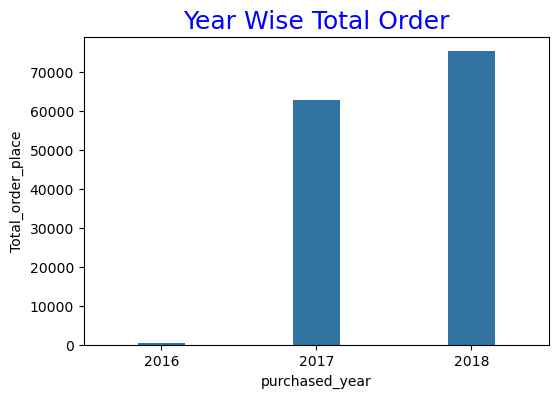

In [89]:
plt.figure(figsize= (6,4))
sns.barplot(x=year_wise_summary.purchased_year , y= year_wise_summary.Total_order_place, width=0.3)
plt.title('Year Wise Total Order', size=18 , color='b')
plt.show()

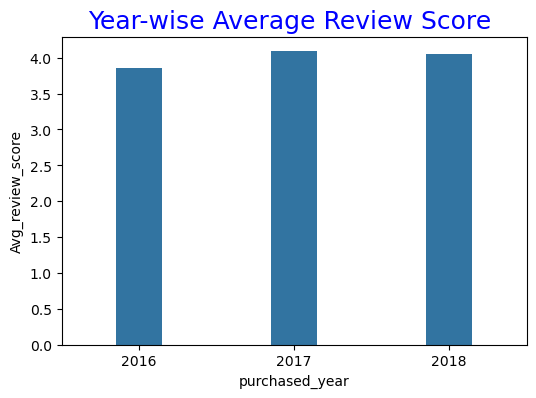

In [90]:
plt.figure(figsize= (6,4))
sns.barplot(x=year_wise_summary.purchased_year , y= year_wise_summary.Avg_review_score, width=0.3)
plt.title('Year-wise Average Review Score ', size=18 , color='b')
plt.show()

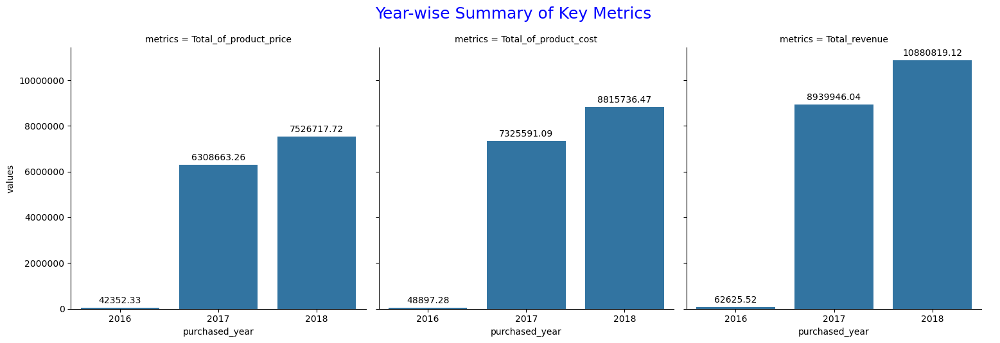

In [91]:
df_melted= pd.melt(year_wise_summary, id_vars= 'purchased_year' , value_vars= ['Total_of_product_price', 'Total_of_product_cost'
                                                                           ,'Total_revenue'], var_name= 'metrics' , value_name='values')

ax= sns.catplot(df_melted, x= 'purchased_year', y='values' , col='metrics', kind='bar', col_wrap=3 )
for ax in ax.axes.flatten():
    for container in ax.containers:
        ax.bar_label(container, fmt='%.2f', padding=3)

plt.suptitle("Year-wise Summary of Key Metrics", fontsize=18, y=1.06, color='b')
plt.ticklabel_format(axis='y' , style= 'plain')
plt.show()

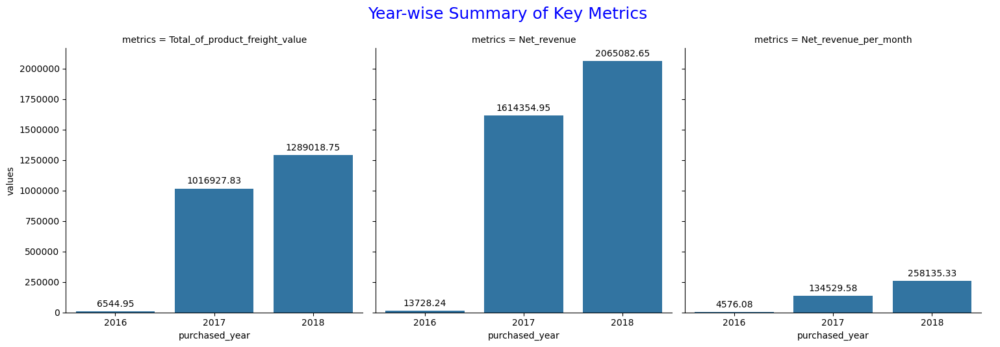

In [92]:
df_melted= pd.melt(year_wise_summary, id_vars= 'purchased_year' , value_vars= ['Total_of_product_freight_value','Net_revenue', 
                                                                           'Net_revenue_per_month'], var_name= 'metrics' , value_name='values')

ax= sns.catplot(df_melted, x= 'purchased_year', y='values' , col='metrics', kind='bar', col_wrap=3 )
for ax in ax.axes.flatten():
    for container in ax.containers:
        ax.bar_label(container, fmt='%.2f', padding=3)

plt.suptitle("Year-wise Summary of Key Metrics", y=1.06 , size=18 , color='b')
plt.ticklabel_format(axis='y' , style= 'plain')
plt.show()

## <center><u>**CUSTOMERS-Analysis**</u></center>

###  **New customers acquired every month**

In [1733]:
all_order_info['year_month']= all_order_info.order_purchase_timestamp.dt.to_period('M')
first_purchase= all_order_info.groupby('customer_unique_id')[['year_month']].min().reset_index()
new_customers_per_month = first_purchase.groupby('year_month')['customer_unique_id'].count().reset_index()
new_customers_per_month.columns = ['year_month', 'new_customers']
#new_customers_per_month.head()

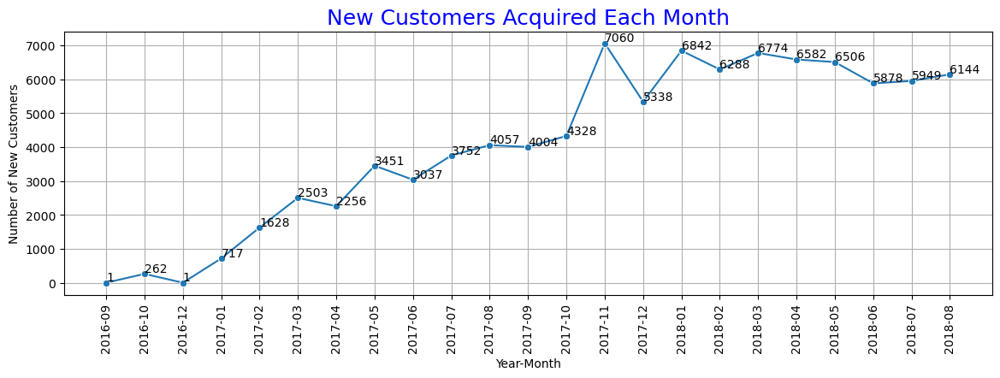

In [97]:
plt.figure(figsize=(14,4))
sns.lineplot(new_customers_per_month , x=new_customers_per_month.year_month.astype(str), y='new_customers', marker='o')
for i , val in enumerate(new_customers_per_month.new_customers):
    plt.text(i, val+50, val )
plt.xticks(rotation=90)
plt.title("New Customers Acquired Each Month", size=18 , color='b')
plt.xlabel("Year-Month")
plt.ylabel("Number of New Customers")
plt.grid(True)
plt.show()

### **Retention of customers on month on month basis**

In [1735]:
customer_month = all_order_info.groupby(['customer_unique_id', 'year_month']).size().unstack(fill_value=0)
customer_month = customer_month.map(lambda x: 1 if x > 0 else 0)

months = list(customer_month.columns)
retention_result = []

for i in range(len(months) - 1):
    current_month = months[i]
    next_month = months[i + 1]

    current_users = customer_month[customer_month[current_month] == 1]
    retained_users = current_users[current_users[next_month] == 1]

    total = len(current_users)
    retained = len(retained_users)
    rate = round((retained / total) * 100, 2) if total > 0 else 0

    retention_result.append({
        'month': str(current_month),
        'active_customers': total,
        'retained_next_month': retained,
        'retention_rate (%)': rate
    })

retention_df = pd.DataFrame(retention_result)
#retention_df.head()

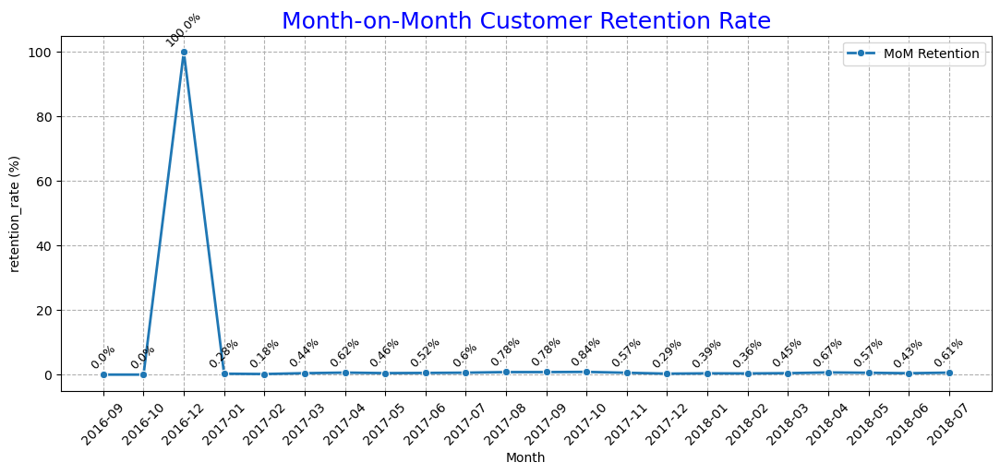

In [100]:
plt.figure(figsize=(13,5))
sns.lineplot(retention_df, x= 'month', y='retention_rate (%)', marker='o', linewidth=2 , label='MoM Retention')
plt.title('Month-on-Month Customer Retention Rate', size=18 , color='b')
plt.xlabel('Month')
plt.xticks(rotation=45)
plt.grid(True, linestyle='--')
for i, val in enumerate(retention_df['retention_rate (%)']):
    plt.text(i, val + 1, f"{val}%", va='bottom', ha='center', rotation=45, fontsize=9)
plt.show()

### **Revenues from existing/new customers on month on month basis**

In [102]:
first_purchase= all_order_info.groupby('customer_unique_id')[['year_month']].min().reset_index()
first_purchase.columns = ['customer_unique_id', 'first_purchase_month']
all_order_info= pd.merge(all_order_info ,first_purchase , on= 'customer_unique_id')

In [103]:
all_order_info['customer_status']= np.where(all_order_info.year_month == all_order_info.first_purchase_month , 'New' , 'Existing')

In [1737]:
cust_mom_revenue= pd.pivot_table(all_order_info , index='year_month', columns='customer_status', values='payment_value' , aggfunc='sum').fillna(0).reset_index()
#cust_mom_revenue.head()

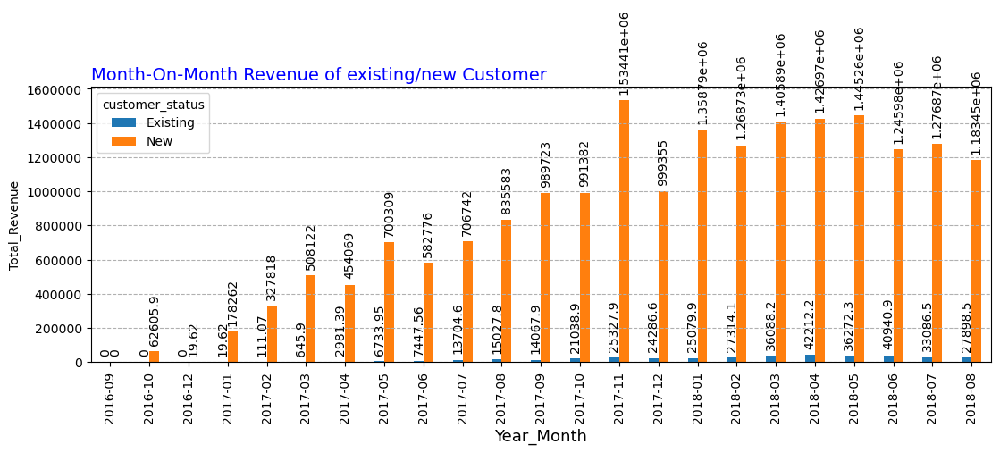

In [105]:
ax= cust_mom_revenue.plot(kind='bar', x='year_month' , figsize=(13,4))
plt.grid(axis='y', linestyle= '--')
plt.ticklabel_format(axis='y', style='plain')
for i in ax.containers:
    plt.bar_label(i,rotation=90 ,padding= 5)
plt.xlabel('Year_Month', fontsize=13)
plt.ylabel('Total_Revenue')
plt.title('Month-On-Month Revenue of existing/new Customer', loc='left' , size=14 ,color= 'b')
plt.show()

### **Customers are paying**

In [1731]:
customer_paying_behaviour= all_order_info.groupby('payment_type').agg({'order_id':'count', 'customer_unique_id':'nunique','payment_value':'sum'}
                                                                                                         ).sort_values('payment_value', ascending= False)
customer_paying_behaviour.columns= ['Order_Count','Unique_Customer','Total_Sales']
#customer_paying_behaviour

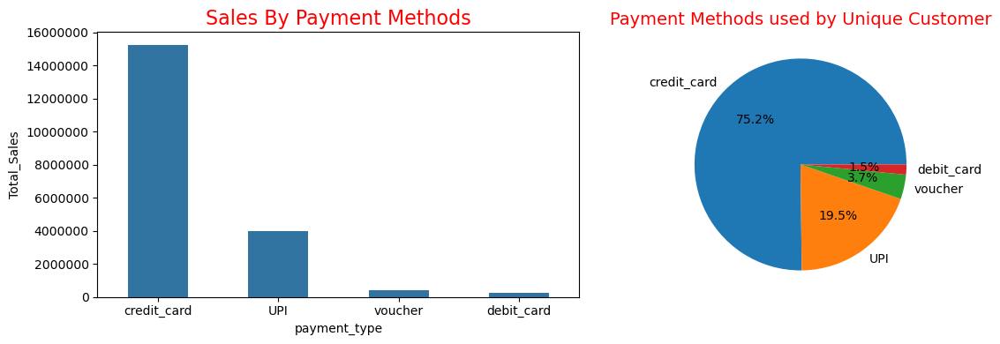

In [1675]:
fig, axes= plt.subplots(1,2 , figsize=(6*2,4))
#plt.figure(figsize=(6,3))
sns.barplot(customer_paying_behaviour.reset_index(), x='payment_type', y='Total_Sales' , ax=axes[0] , width=0.5)
axes[0].set_title('Sales By Payment Methods', size=16, color='r')
axes[0].ticklabel_format(axis='y', style='plain')
customer_paying_behaviour.plot(kind='pie', y='Unique_Customer' , ax=axes[1], legend=False , ylabel='', autopct='%1.1f%%')
axes[1].set_title('Payment Methods used by Unique Customer', size=14, color='r')
plt.tight_layout()
plt.show()

### **Payment channels are used by most Customers**

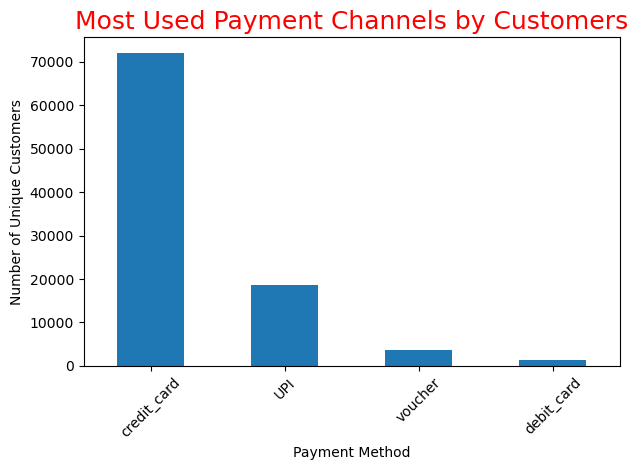

In [1693]:
customer_payment_channel= all_order_info.groupby('payment_type')[['customer_unique_id']].nunique().sort_values('customer_unique_id', ascending=False)
customer_payment_channel.columns= ['Unique_Customer']
customer_payment_channel.plot(kind='bar', legend= False)
plt.title('Most Used Payment Channels by Customers', size=18, color='r')
plt.xlabel('Payment Method')
plt.ylabel('Number of Unique Customers')
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

### **Customer Lifetime Value (CLV)**

In [1999]:
#aov= all_order_info.groupby('order_id')[['payment_value']].sum().mean()
#purchase_freq= all_order_info.order_id.nunique() / all_order_info.customer_unique_id.nunique()
#cv= aov * purchase_freq
#lifespan= (all_order_info.groupby('customer_id')['order_purchase_timestamp'].max() - all_order_info.groupby('customer_id')['order_purchase_timestamp'].min()).dt.days /30 
#avg_lifespan = lifespan.mean()
#clv = cv * avg_lifespan
#clv
clv = (
    all_order_info.groupby('customer_unique_id')['payment_value'].sum().reset_index().rename(columns={'payment_value': 'CLV'})
                                                                                                                .sort_values(by='CLV', ascending=False))
clv.head(10)

,customer_unique_id,CLV
3724,0a0a92112bd4c708ca5fde585afaa872,109312.64
38579,698e1cf81d01a3d389d96145f7fa6df8,45256.00
71566,c402f431464c72e27330a67f7b94d4fb,44048.00
23411,4007669dec559734d6f53e029e360987,36489.24
87448,ef8d54b3797ea4db1d63f0ced6a906e9,30186.00
43168,763c8b1c9c68a0229c42c9fc6f662b93,29099.52
73127,c8460e4251689ba205045f3ea17884a1,27935.46
85765,eae0a83d752b1dd32697e0e7b4221656,25051.89
22395,3d47f4368ccc8e1bb4c4a12dbda7111b,22346.60
63528,adfa1cab2b2c8706db21bb13c0a1beb1,19457.04


## <center><u>**SALES-Analysis**</u></center>

### **Trends/seasonality of sales**

In [1739]:
month_wise_sales= all_order_info.groupby(['purchased_month','purchased_month_name'])[['payment_value']].sum().reset_index().rename(columns=
                                                                                {'purchased_month_name':'Months','payment_value':'Total_Sales'})
month_wise_sales.drop(columns='purchased_month',inplace= True)
#month_wise_sales

#### STATICS GRAPH

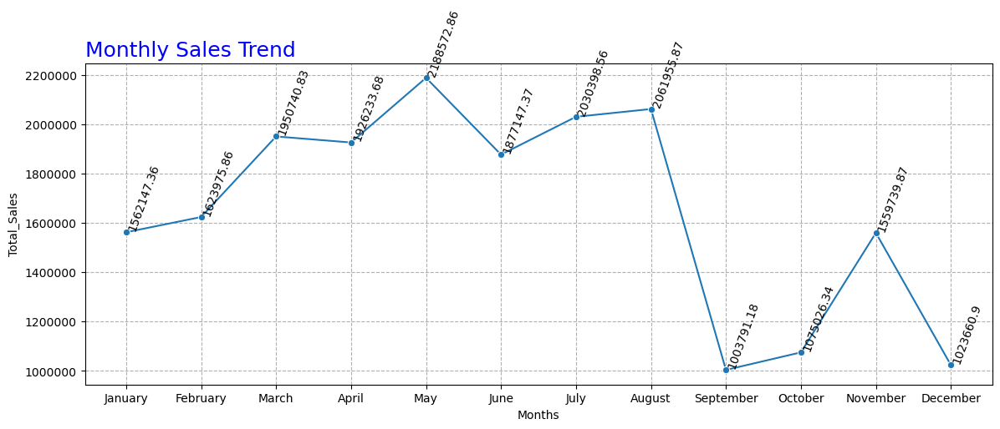

In [110]:
plt.figure(figsize=(14,5))
ax= sns.lineplot(month_wise_sales , x=month_wise_sales.Months, y='Total_Sales' , marker='o')
plt.title('Monthly Sales Trend' , loc='left' , size=18 ,color= 'b')
plt.ticklabel_format(axis='y' , style='plain')
plt.grid(linestyle='--')
for i, val in enumerate(month_wise_sales.Total_Sales):
    plt.text(i, val, f'{val}' , va= 'bottom', rotation=70)
plt.show()

#### LIVE or INTERACTIVE GRAPH

In [112]:
fig=px.line(month_wise_sales , x=month_wise_sales.Months, y='Total_Sales', title='Monthly Revenue Trend' , width=1000)
fig.update_traces(mode='lines+markers')
fig.update_layout(xaxis_title='Months')

### **Sales by Location**

In [1741]:
loc_sales= all_order_info.groupby(['customer_state'])[['payment_value']].sum().sort_values('payment_value', ascending= False)
loc_sales.columns= ['Sales']
#loc_sales.head()

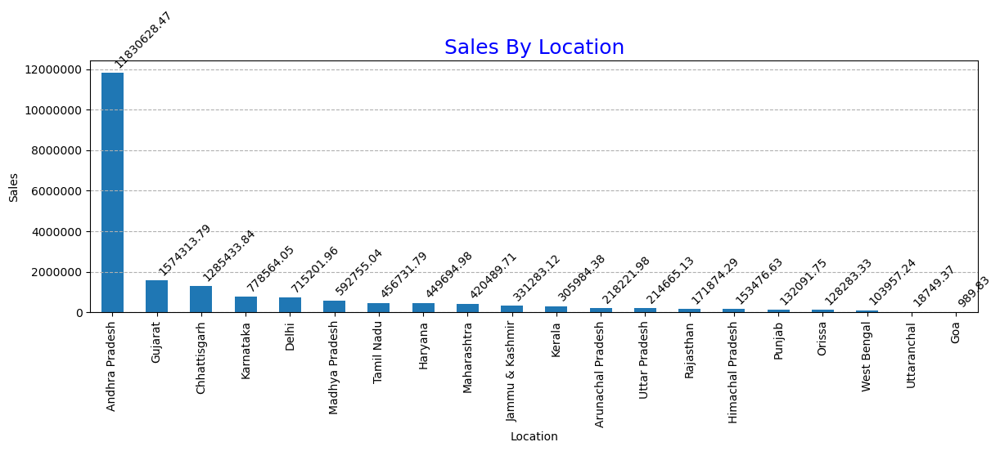

In [115]:
ax=loc_sales.plot(kind='bar',figsize= (14,4), legend= False)
plt.xlabel('Location')
plt.ylabel('Sales')
plt.title('Sales By Location', size=18 ,color= 'b')
plt.grid(linestyle='--', axis='y')
plt.ticklabel_format(axis='y', style='plain')
for i,val in enumerate(loc_sales.Sales):
    plt.text(i , val+250000 , f'{val}', rotation=45)
plt.show()

### **Sales by Month**

In [1743]:
month_sales= all_order_info.groupby('year_month')[['payment_value']].sum().sort_values('payment_value', ascending= False)
month_sales.columns= ['Total_Sales']
#month_sales.head()

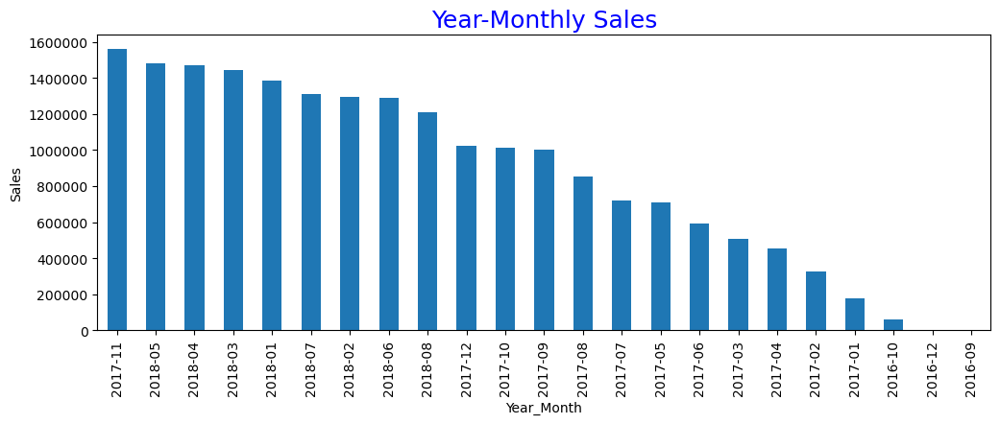

In [118]:
month_sales.plot(kind='bar', figsize=(12,4), legend= False)
plt.title('Year-Monthly Sales', size=18, color='b')
plt.ylabel('Sales')
plt.xlabel('Year_Month')
plt.ticklabel_format(axis='y', style='plain')
#for i , val in enumerate(month_sales.Total_Sales):
#    plt.text(i, val+50000, f'{val}', rotation=90 )
plt.show()

### **Sales by Week**

In [1745]:
iso= all_order_info.order_purchase_timestamp.dt.isocalendar()
all_order_info['week_no']= iso.week
week_sales= all_order_info.groupby(['purchased_year','week_no'])[['payment_value']].sum().reset_index()
week_sales.columns=['Year','Week_No','Sales']
week_sales['Week_No']= 'W-' + week_sales.Week_No.astype(str)
#week_sales.head()

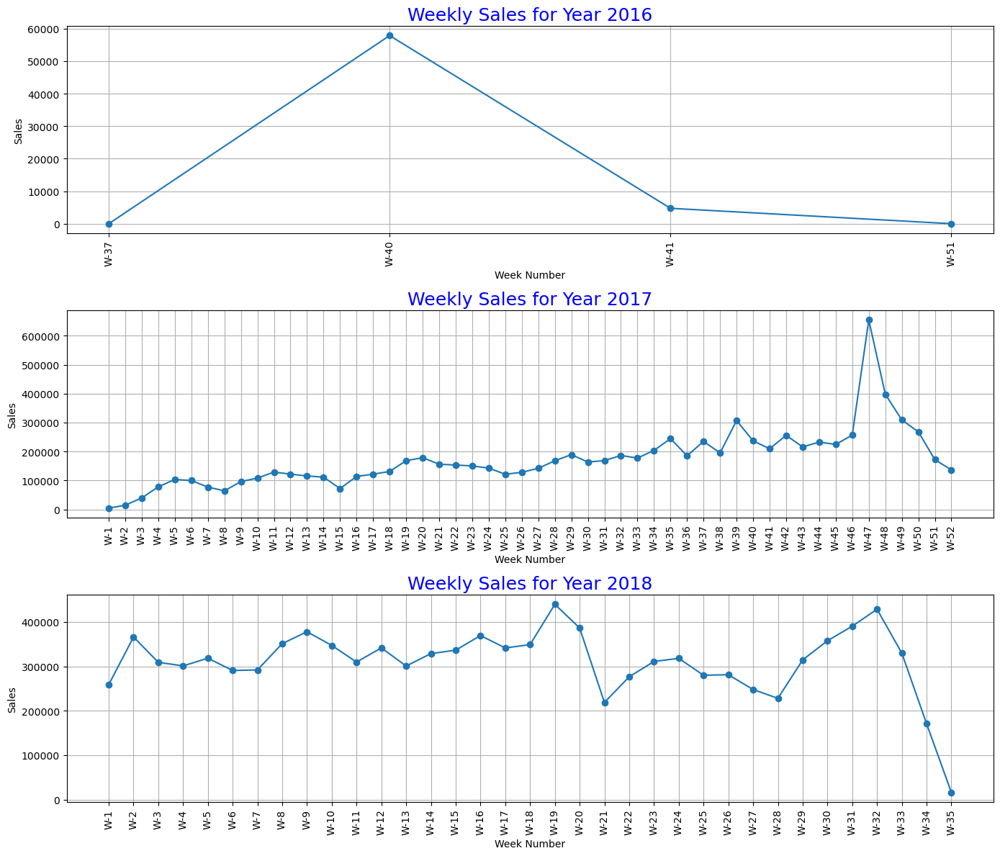

In [121]:
n= len(week_sales.Year.unique())
fig, axes= plt.subplots(3, 1, figsize=(14,4*n))
for i , val in enumerate(week_sales.Year.unique()):
    ax= axes[i]
    data = week_sales[week_sales.Year== val]
    ax.plot(data.Week_No, data.Sales, marker='o')
    ax.set_title(f'Weekly Sales for Year {val}', size=18 , color='b')
    ax.set_xlabel('Week Number')
    ax.set_ylabel('Sales')
    ax.tick_params(axis='x', rotation=90)
    ax.grid(True)
plt.tight_layout()

### **Sales by Day**

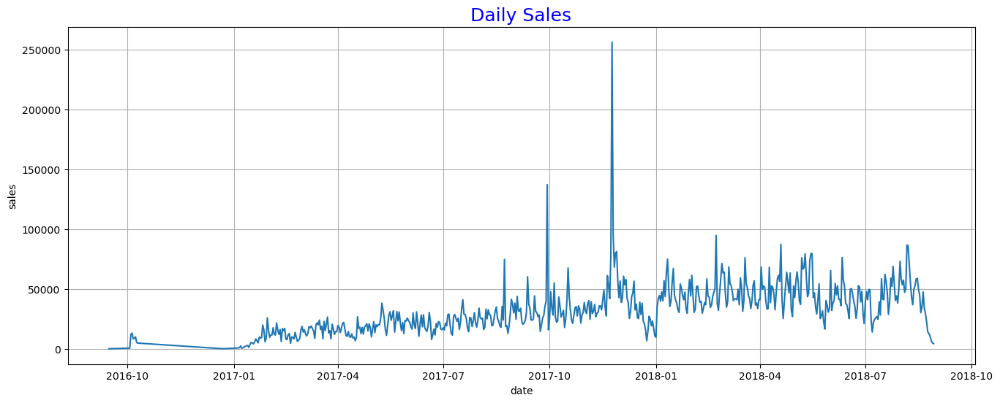

In [123]:
date = all_order_info['order_purchase_timestamp'].dt.date
daily_sales = all_order_info.groupby(date)['payment_value'].sum().reset_index()
daily_sales.columns=['date','sales']
#daily_sales.plot(x='date', y='sales', kind='line', figsize=(16, 6), title="Sales by Day")
plt.figure(figsize=(16,6))
sns.lineplot(daily_sales , x='date', y='sales')
plt.title('Daily Sales', size=18 , color='b' )
plt.grid()
plt.show()

In [124]:
plt.figure(figsize=(16,6))
px.line(daily_sales , x='date', y='sales', width=1100, height=500, title='Daily Sales')

<Figure size 1600x600 with 0 Axes>

### **Sales by Week days**

In [1747]:
all_order_info['week_day']= all_order_info.order_purchase_timestamp.dt.day_name()
week_day_sales= all_order_info.groupby('week_day')[['payment_value']].sum().reset_index()
week_day_sales.columns= ['Week_Days','Sales']
#week_day_sales

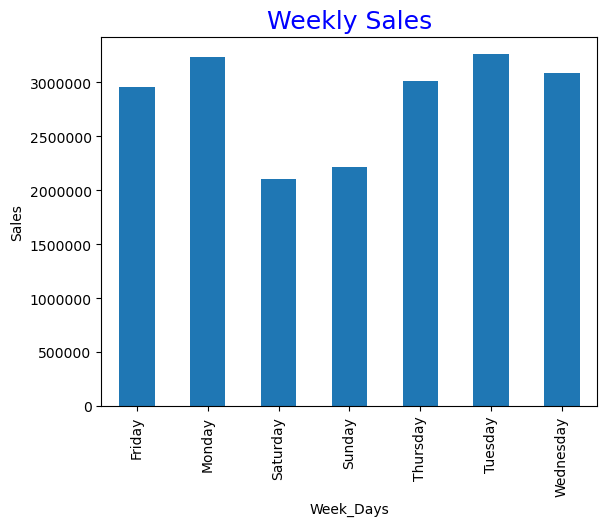

In [127]:
week_day_sales.plot(kind='bar', x='Week_Days' , legend= False)
plt.title('Weekly Sales', size=18 , color='b')
plt.ylabel('Sales')
plt.ticklabel_format(axis='y' , style='plain')
plt.show()

### **Sales by Time(Hour of Day)**

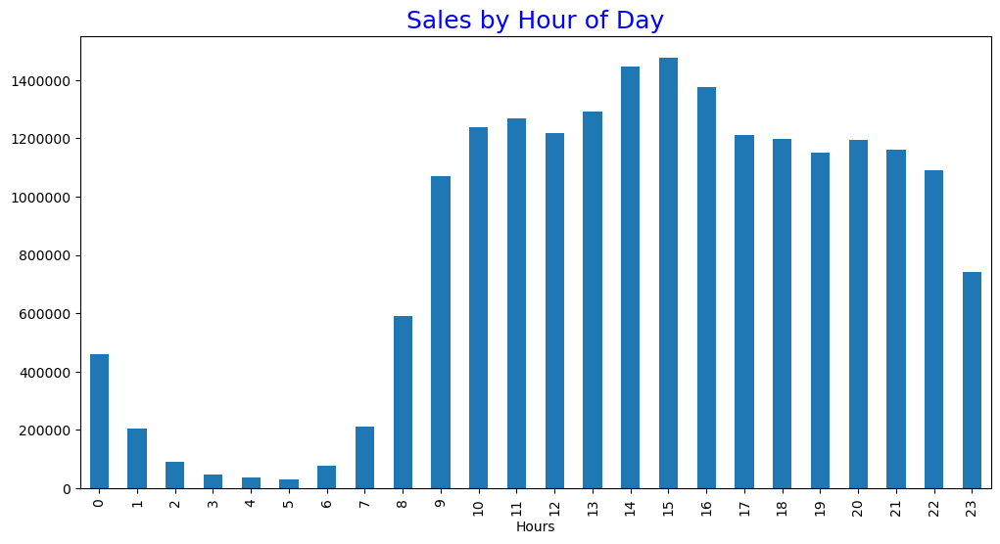

In [129]:
time= all_order_info.order_purchase_timestamp.dt.hour
hourly_sales= all_order_info.groupby(time)[['payment_value']].sum().reset_index()
hourly_sales.columns= ['Hours','Sales']
hourly_sales.plot(x='Hours', y='Sales', kind='bar', figsize=(12, 6), legend= False)
plt.title("Sales by Hour of Day",size=18 , color='b')
plt.ticklabel_format(axis='y', style='plain')
plt.show()

### **Sales by Payment Method**

In [1749]:
payment_method_sales= all_order_info.groupby('payment_type')[['payment_value']].sum().sort_values('payment_value', ascending= False)
#payment_method_sales

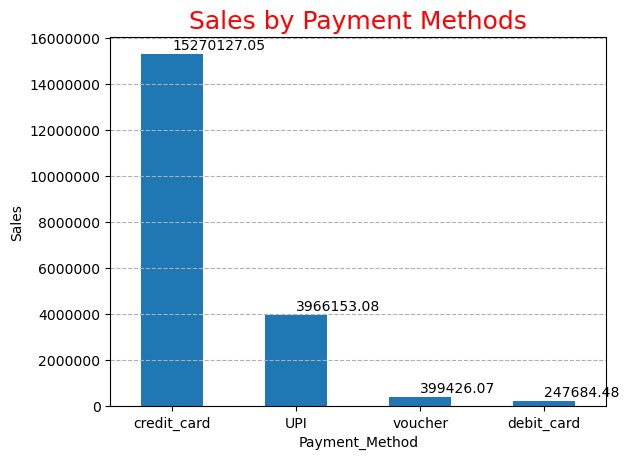

In [132]:
payment_method_sales.plot(kind='bar', legend= False)
plt.ylabel('Sales')
plt.xlabel('Payment_Method')
plt.title('Sales by Payment Methods', size=18 , color='r')
plt.xticks(rotation=0)
plt.ticklabel_format(axis='y' , style='plain')
for i , val in enumerate(payment_method_sales.payment_value):
    plt.text(i, val+200000, f'{val}')
plt.grid(axis='y' , linestyle='--')
plt.show()

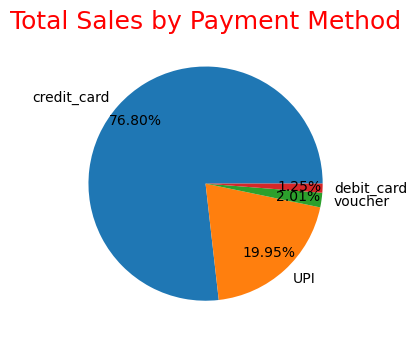

In [133]:
payment_method_sales.plot(kind='pie', y='payment_value', legend= False ,autopct='%.2f%%' , figsize=(4,4) ,pctdistance=0.8 , ylabel='')
plt.title('Total Sales by Payment Method', fontsize=18 , color='r')
plt.tight_layout()
plt.show()

## <center><u>**QUANTITY-Analysis**</u></center>

### **Quantity by category**

In [1751]:
#prod_order_item= pd.merge(order_item , product , on='product_id')
category_quantity= all_order_info.groupby('product_category_name')[['product_id']].count().reset_index().rename(columns=
                                                                    {'product_category_name':'Product_Category','product_id':'Quantity'})
category_quantity.sort_values('Quantity', ascending= False , inplace= True, ignore_index= True)
#category_quantity.head()

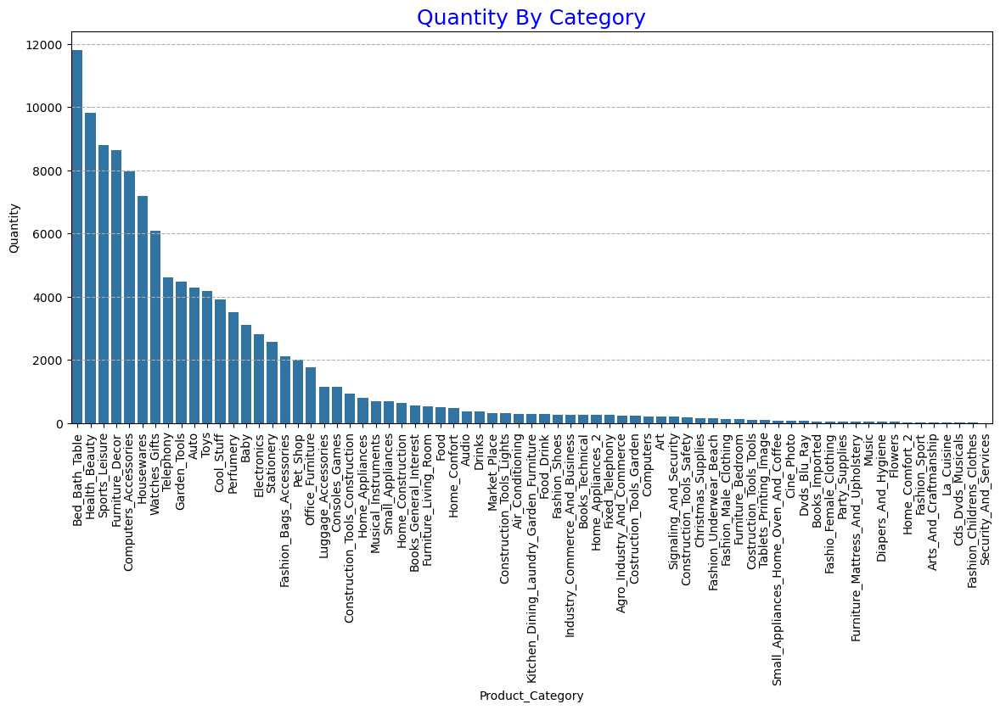

In [678]:
plt.figure(figsize=(14,6))
sns.barplot(category_quantity, x='Product_Category', y= 'Quantity')
plt.xticks(rotation=90)
plt.title('Quantity By Category' , size=18 , color='b')
plt.grid(axis='y', linestyle='--')
plt.show()

### **Quantity by Month**

In [1753]:
month_qty= all_order_info.groupby('year_month')[['product_id']].count().sort_values('product_id', ascending= False)
month_qty.columns= ['Total_Qty']
#month_qty.head()

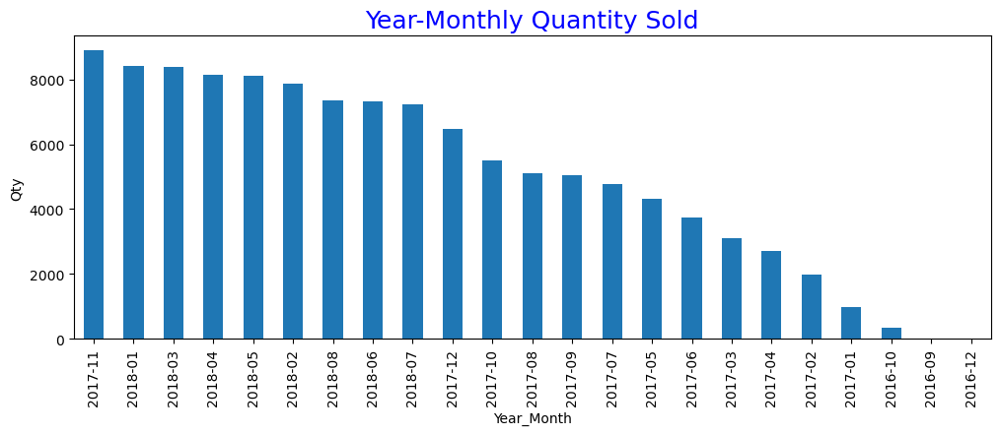

In [140]:
month_qty.plot(kind='bar', figsize=(12,4), legend= False)
plt.title('Year-Monthly Quantity Sold', size=18, color='b')
plt.ylabel('Qty')
plt.xlabel('Year_Month')
plt.ticklabel_format(axis='y', style='plain')
#for i , val in enumerate(month_sales.Total_Sales):
#    plt.text(i, val+50000, f'{val}', rotation=90 )
plt.show()

### **Quantity by Week**

In [1755]:
week_qty= all_order_info.groupby(['purchased_year','week_no'])[['product_id']].count().reset_index()
week_qty.columns=['Year','Week_No','Qty']
week_qty['Week_No']= 'W-' + week_qty.Week_No.astype(str)
#week_qty.head()

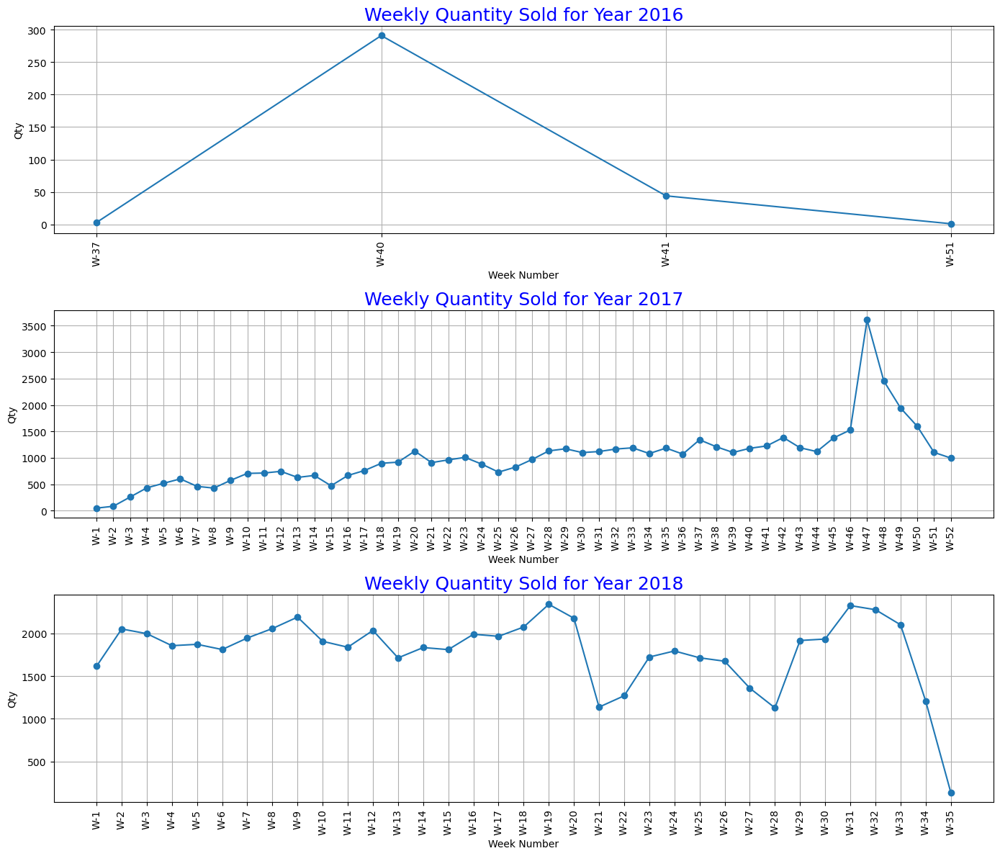

In [143]:
n= len(week_qty.Year.unique())
fig, axes= plt.subplots(3, 1, figsize=(14,4*n))
for i , val in enumerate(week_qty.Year.unique()):
    ax= axes[i]
    data = week_qty[week_qty.Year== val]
    ax.plot(data.Week_No, data.Qty, marker='o')
    ax.set_title(f'Weekly Quantity Sold for Year {val}', size=18 , color='b')
    ax.set_xlabel('Week Number')
    ax.set_ylabel('Qty')
    ax.tick_params(axis='x', rotation=90)
    ax.grid(True)
plt.tight_layout()

### **Quantity by Day**

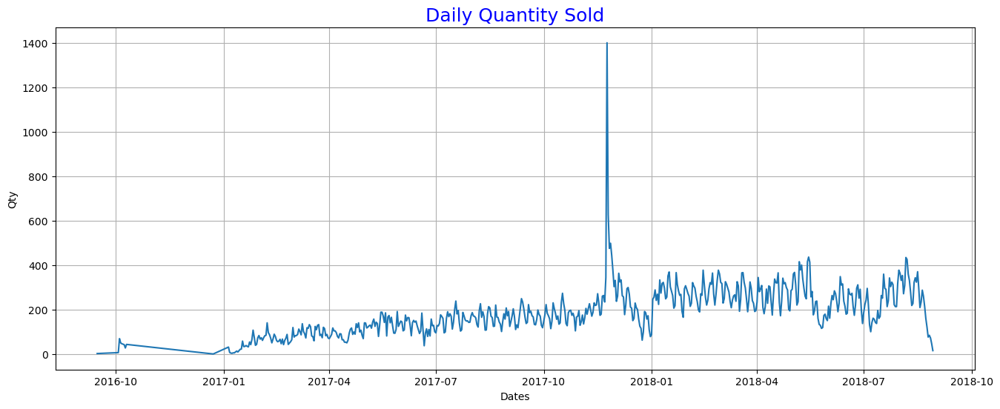

In [145]:
date = all_order_info['order_purchase_timestamp'].dt.date
daily_qty = all_order_info.groupby(date)[['product_id']].count().reset_index()
daily_qty.columns=['Dates','Qty']
#daily_sales.plot(x='date', y='sales', kind='line', figsize=(16, 6), title="Sales by Day")
plt.figure(figsize=(16,6))
sns.lineplot(daily_qty , x='Dates', y='Qty')
plt.title('Daily Quantity Sold', size=18 , color='b' )
plt.grid()
plt.show()

In [146]:
plt.figure(figsize=(16,6))
px.line(daily_qty , x='Dates', y='Qty', width=1100, height=500, title='Daily Quantity Sold')

<Figure size 1600x600 with 0 Axes>

### **Quantity by Week days**

In [1757]:
week_day_qty= all_order_info.groupby('week_day')[['product_id']].count().reset_index()
week_day_qty.columns= ['Week_Days','Qty']
#week_day_qty

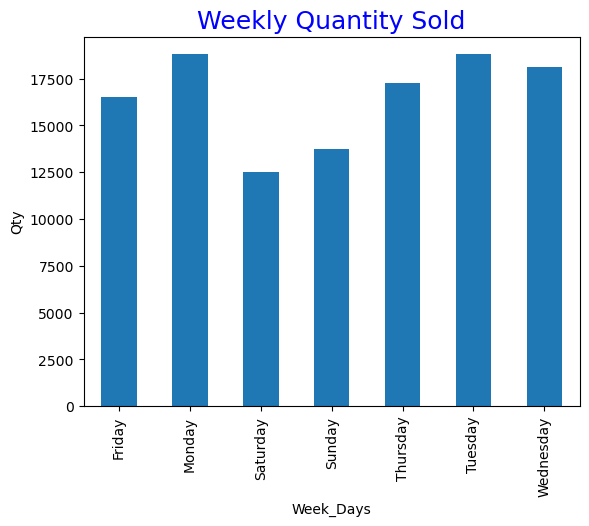

In [149]:
week_day_qty.plot(kind='bar', x='Week_Days' , legend= False)
plt.title('Weekly Quantity Sold', size=18 , color='b')
plt.ylabel('Qty')
plt.ticklabel_format(axis='y' , style='plain')
plt.show()

### **Quantity by Time(Hour of Day)**

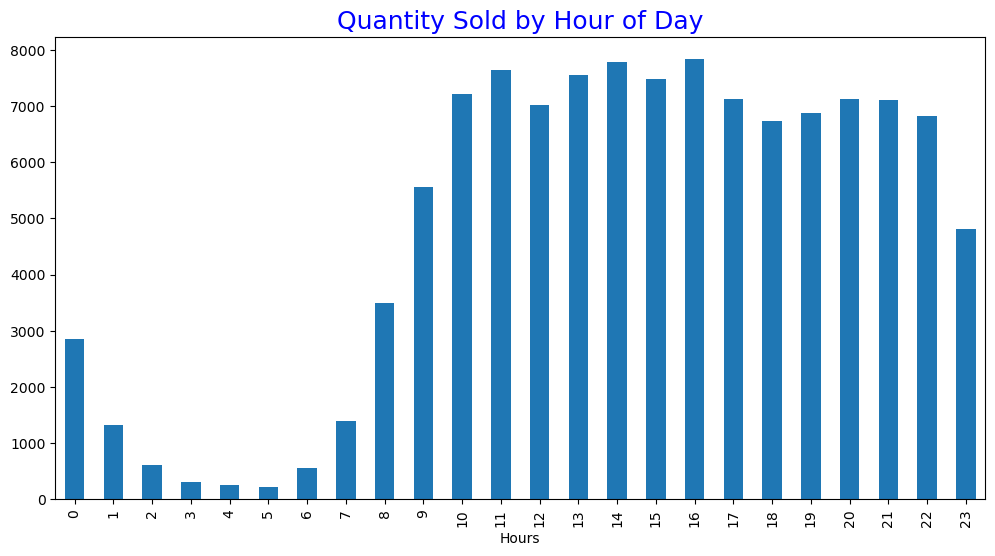

In [151]:
time= all_order_info.order_purchase_timestamp.dt.hour
hourly_qty= all_order_info.groupby(time)[['product_id']].count().reset_index()
hourly_qty.columns= ['Hours','Qty']
hourly_qty.plot(x='Hours', y='Qty', kind='bar', figsize=(12, 6), legend= False)
plt.title("Quantity Sold by Hour of Day",size=18 , color='b')
plt.ticklabel_format(axis='y', style='plain')
plt.show()

### **Quantity by Payment Method**

In [1759]:
payment_method_qty= all_order_info.groupby('payment_type')[['product_id']].count().sort_values('product_id', ascending= False)
payment_method_qty.columns= ['Qty']
#payment_method_qty

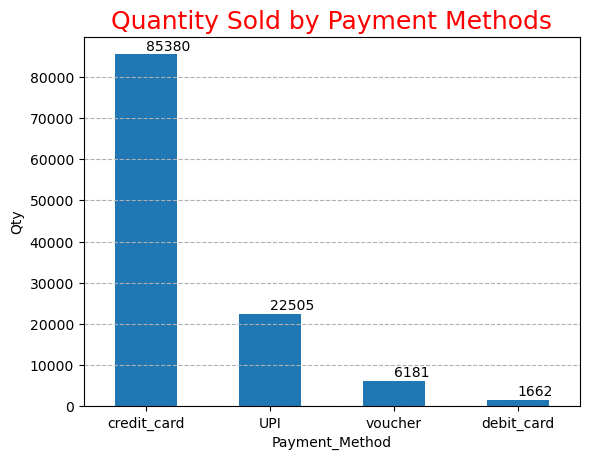

In [154]:
payment_method_qty.plot(kind='bar', legend= False)
plt.ylabel('Qty')
plt.xlabel('Payment_Method')
plt.title('Quantity Sold by Payment Methods', size=18 , color='r')
plt.xticks(rotation=0)
plt.ticklabel_format(axis='y' , style='plain')
for i , val in enumerate(payment_method_qty.Qty):
    plt.text(i, val+1000 , f'{val}')
plt.grid(axis='y' , linestyle='--')
plt.show()

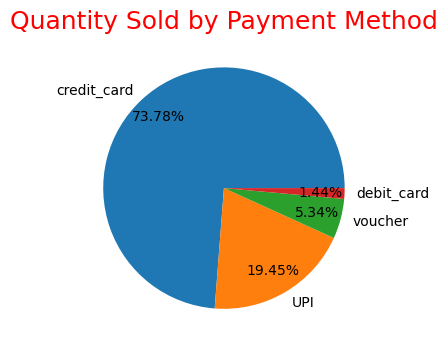

In [155]:
payment_method_qty.plot(kind='pie', y='Qty', legend= False ,autopct='%.2f%%' , figsize=(4,4) ,pctdistance=0.8 , ylabel='')
plt.title('Quantity Sold by Payment Method', fontsize=18 , color='r')
plt.tight_layout()
plt.show()

## <center><u>**PRODUCT-Analysis**</u></center>

### **Popular Products by Month (Quantity Sold Wise)**

In [1761]:
prod_month= all_order_info.groupby(['year_month','product_id'])[['order_id']].count().reset_index()
prod_month.columns= ['year_month','product_id','quantity_sold']
top5_product= prod_month.sort_values(by= ['year_month','quantity_sold'] , ascending=[True, False]).groupby('year_month').head(1).reset_index(drop=True)
#top5_product.head()

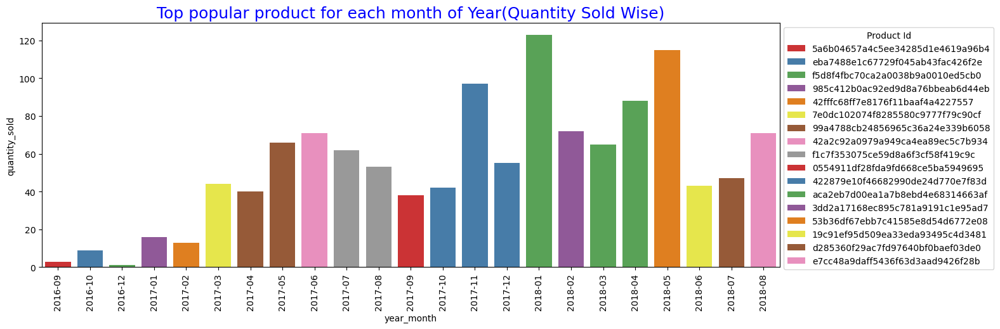

In [769]:
plt.figure(figsize=(15,5))
sns.barplot(top5_product, x=top5_product.year_month.astype(str ), y='quantity_sold', hue='product_id' , palette='Set1')
plt.xticks(rotation=90)
plt.legend(title='Product Id',fontsize=10, loc='upper left', bbox_to_anchor=(1,1))
plt.title('Top popular product for each month of Year(Quantity Sold Wise)', size=18 , color='b')
plt.show()

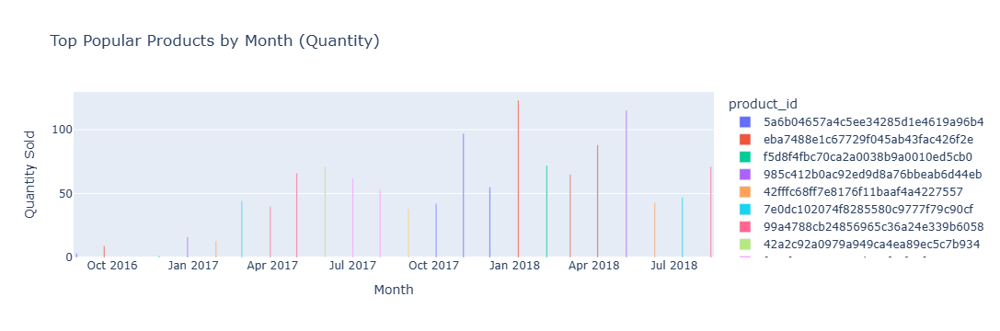

In [773]:
fig = px.bar(top5_product, x=top5_product.year_month.astype(str), y='quantity_sold', color='product_id', title='Top Popular Products by Month (Quantity)',
                            labels={'quantity_sold': 'Quantity Sold', 'x': 'Month'}, barmode='group')
fig.update_layout(xaxis={'categoryorder': 'category ascending'})
fig.show()

### **Popular Products by Month (Sales Wise)**

In [1763]:
prod_month_sales= all_order_info.groupby(['year_month','product_id'])[['payment_value']].sum().reset_index()
prod_month_sales.columns= ['year_month','product_id','sales']
top5_product_sales= prod_month_sales.sort_values(by= ['year_month','sales'] , ascending=[True, False]).groupby('year_month').head(1).reset_index(drop=True)
#top5_product_sales.head()

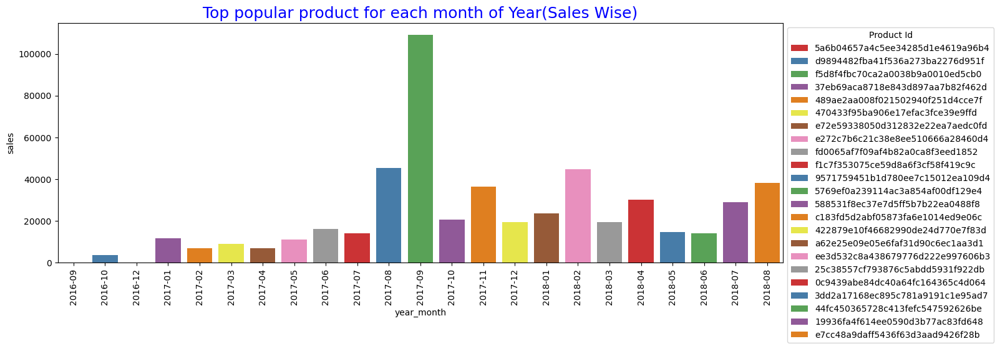

In [786]:
plt.figure(figsize=(15,5))
sns.barplot(top5_product_sales, x=top5_product.year_month.astype(str ), y='sales', hue='product_id' , palette='Set1')
plt.xticks(rotation=90)
plt.legend(title='Product Id',fontsize=10, loc='upper left', bbox_to_anchor=(1,1))
plt.title('Top popular product for each month of Year(Sales Wise)', size=18 , color='b')
plt.show()

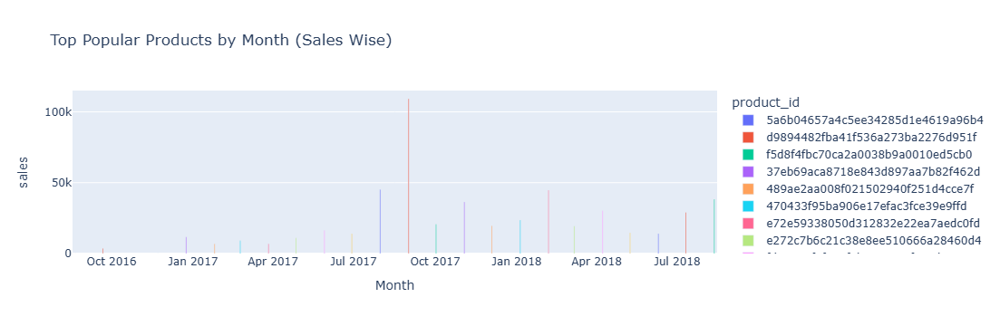

In [788]:
fig = px.bar(top5_product_sales, x=top5_product_sales.year_month.astype(str), y='sales', color='product_id', title='Top Popular Products by Month (Sales Wise)',
                            labels={'quantity_sold': 'Sales', 'x': 'Month'}, barmode='group')
#fig.update_layout(xaxis={'categoryorder': 'category ascending'})
fig.show()

## **Popular Products by state (Quantity Sold Wise)**

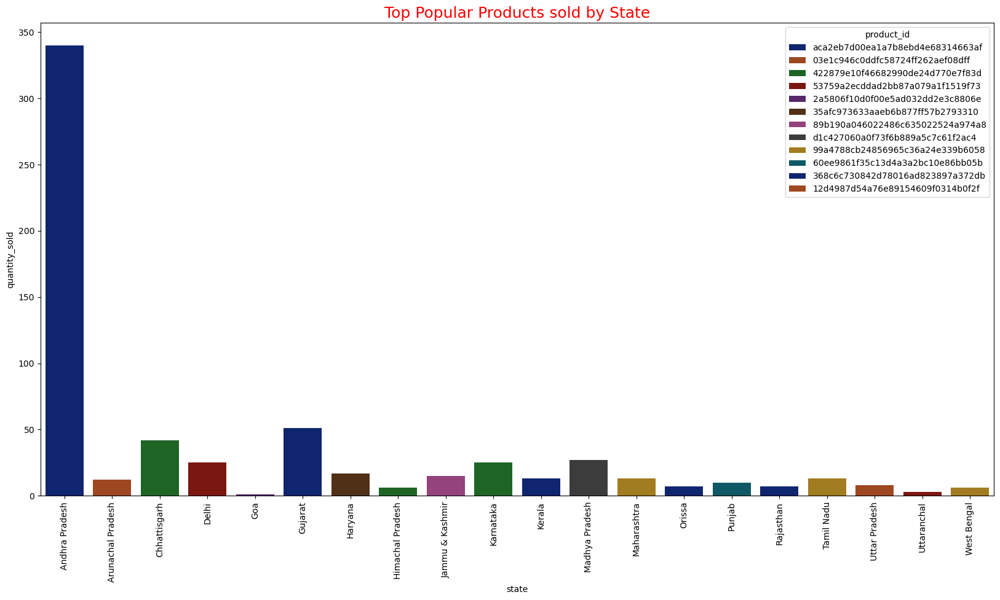

In [942]:
state_prod= all_order_info.groupby(['customer_state','product_id'])[['order_id']].count().sort_values(['customer_state','order_id'], ascending= [True, False]).reset_index()
state_prod.columns= ['state','product_id','quantity_sold']
top_product_state= state_prod.groupby('state').head(1)
plt.figure(figsize=(20,10))
sns.barplot(top_product_state, x='state' , y='quantity_sold' , hue='product_id' , palette='dark' )
plt.xticks(rotation=90)
plt.title("Top Popular Products sold by State", size=18, color='r')
plt.show(close=None)

#g= sns.catplot(top_product_state, col='state', x='quantity_sold', y='product_id',  hue='product_id', 
#                                                                           label= False, col_wrap=4, kind='bar', sharex=False, palette='Set1')
#g.set_axis_labels("Quantity Sold", "Product Id")
#g.fig.suptitle("Top Popular Products sold by State", size=20, y=1.02 , color='b')
#plt.tight_layout()
#plt.show()

## **Popular Products by state (Sales Wise)**

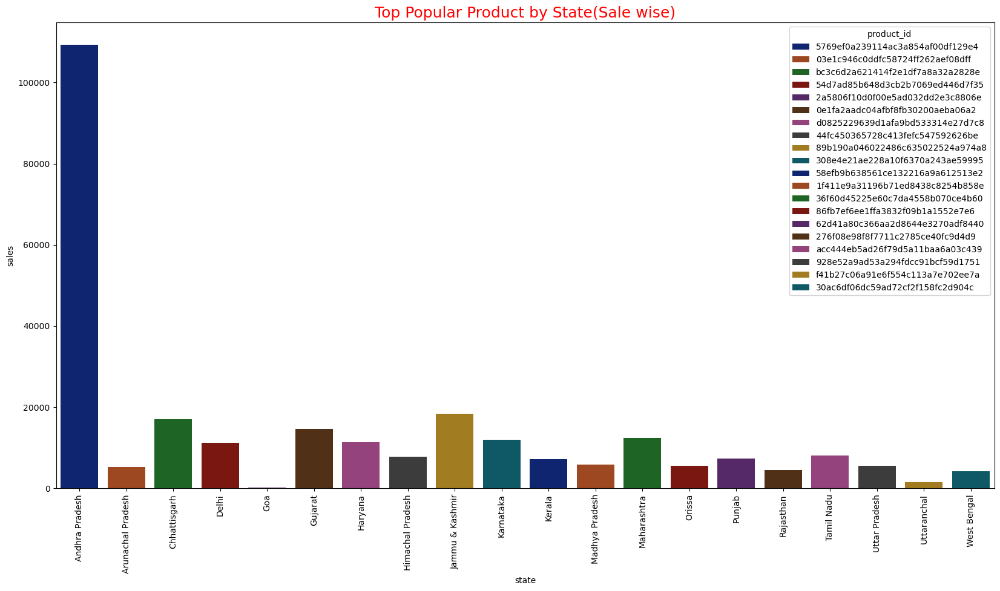

In [944]:
state_sales= all_order_info.groupby(['customer_state','product_id'])[['payment_value']].sum().sort_values(
                                                                        ['customer_state','payment_value'], ascending= [True, False]).reset_index()

state_sales.columns= ['state','product_id','sales']
top_product_sales= state_sales.groupby('state').head(1)
plt.figure(figsize=(20,10))
sns.barplot(top_product_sales, x='state' , y='sales' , hue='product_id' , palette='dark' )
plt.xticks(rotation=90)
plt.title("Top Popular Product by State(Sale wise)", size=18, color='r')
plt.show()

#g= sns.catplot(top_product_sales, col='state', x='sales', y='product_id', hue='product_id', 
#                                                                   label= False, col_wrap=4, kind='bar', sharex=False, palette='Set1')
#g.set_axis_labels("Sales", "Product Id")
#g.fig.suptitle("Top Popular Product by State(Sale wise)", size=20, y=1.02 , color='b')
#plt.tight_layout()
#plt.show()

## **Top 5 Popular Products Sold by Top 10 seller (Qty Wise)**

In [1765]:
top10_seller= all_order_info.groupby('seller_id')['order_id'].count().sort_values(ascending= False).head(10).index
top10_seller_prod= all_order_info[all_order_info.seller_id.isin(top10_seller)].groupby(['seller_id','product_id'])[['order_id']].count().sort_values(
                                                        ['seller_id','order_id'], ascending=[True , False]).groupby('seller_id').head(5).reset_index()

top10_seller_prod.columns= ['seller_id','product_id','quantity_sold']
#top10_seller_prod.head(5)

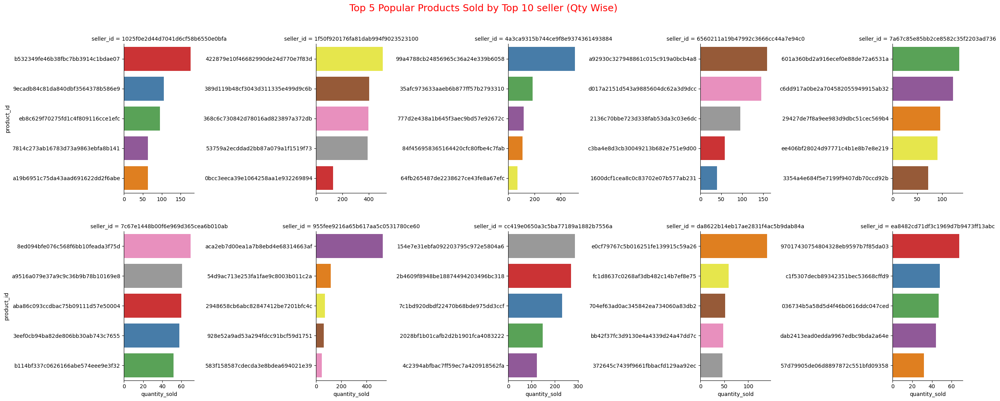

In [1000]:
x=sns.catplot(top10_seller_prod, x='quantity_sold', y='product_id', col='seller_id', kind='bar' , sharex=False , col_wrap=5, sharey=False ,
                                                                              hue='product_id', palette='Set1')
x.fig.suptitle('Top 5 Popular Products Sold by Top 10 seller (Qty Wise)', fontsize=18, y=1.03 , color='r')
plt.tight_layout(h_pad=4)
plt.show()

## **Popular Product by Category (Qty Wise)**

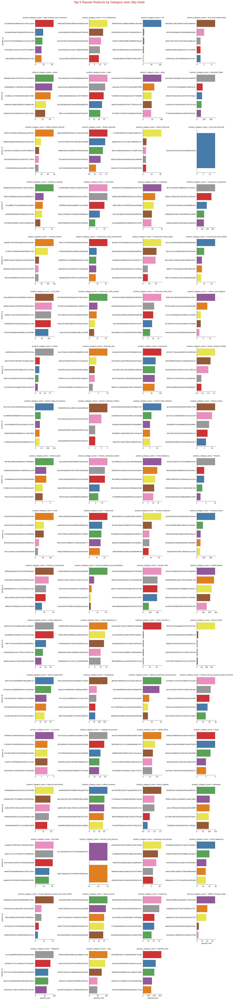

In [1002]:
top_cat_prod= all_order_info.groupby(['product_category_name','product_id'])[['order_id']].count().sort_values(
                                            ['product_category_name','order_id'], ascending=[True, False]).groupby('product_category_name').head(5).reset_index()

top_cat_prod.columns= ['product_category_name','product_id','quantity_sold']

x= sns.catplot(top_cat_prod, col='product_category_name', x='quantity_sold' , y='product_id', col_wrap=4 , sharex= False, sharey=False , kind='bar',
                                                                                                                hue='product_id', palette='Set1')
x.fig.suptitle('Top 5 Popular Products by Category wise (Qty Sold)', fontsize=18, y=1.01 , color='r')
plt.tight_layout(h_pad=4)
plt.show()                                                                                               

### **Top 10 most expensive products sorted by price**

In [1767]:
top_expensive_product= all_order_info.groupby(['product_id'])[['price']].max().sort_values('price', ascending= False).head(10)
#top_expensive_product

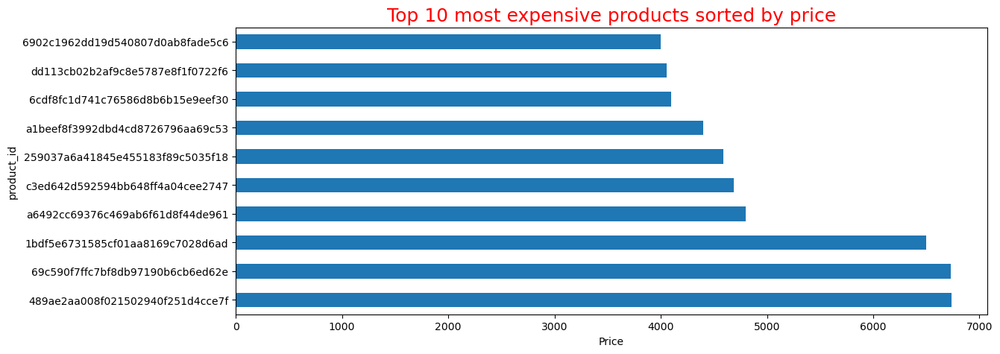

In [1136]:
top_expensive_product.plot(kind='barh', legend=False, figsize=(13,5))
plt.xlabel('Price')
plt.title('Top 10 most expensive products sorted by price' , size=18 , color='r')
plt.show()

## **<center><u>Categories-Analysis</u></center>**

### **Popular categories by state**

In [1258]:
cat_state= all_order_info.groupby(['customer_state','product_category_name'])[['order_id']].count().sort_values(
                                                ['customer_state','order_id'], ascending=[True,False]).reset_index().groupby('customer_state').head(1)
cat_state.columns=['State','Product_Category', 'Quantity_Sold']

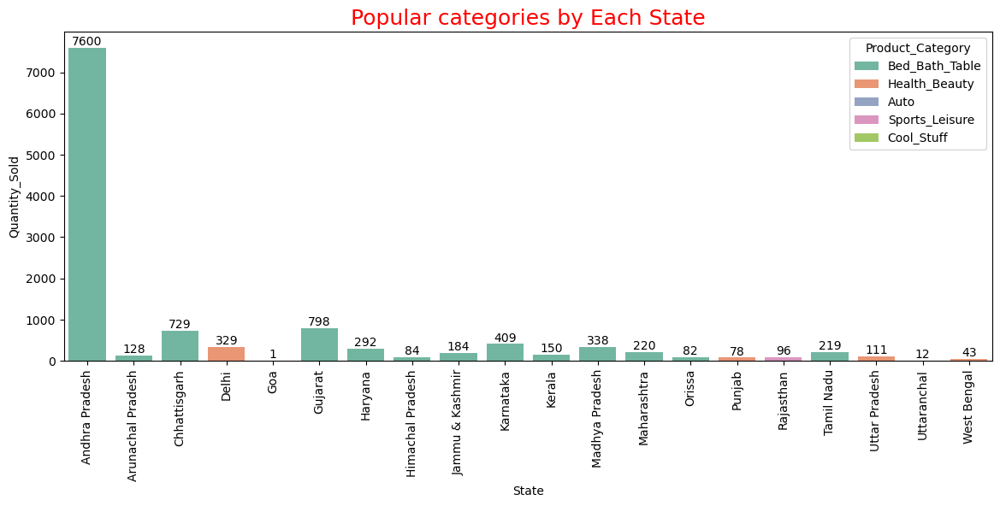

In [1242]:
plt.figure(figsize=(14,5))
ax=sns.barplot(cat_state, x= 'State' , y='Quantity_Sold', hue= 'Product_Category', palette= 'Set2')
plt.xticks(rotation=90)
plt.title('Popular categories by Each State', size=18, color='r')
for i in ax.containers:
    plt.bar_label(i)
plt.show()

### **Popular categories by Month**

In [1260]:
cat_month= all_order_info.groupby(['year_month','product_category_name'])[['order_id']].count().sort_values(['year_month','order_id'],
                                                                        ascending=[True, False]).reset_index().groupby('year_month').head(1)
cat_month.columns= ['Year_Month','Product_Category','Quantity_Sold']

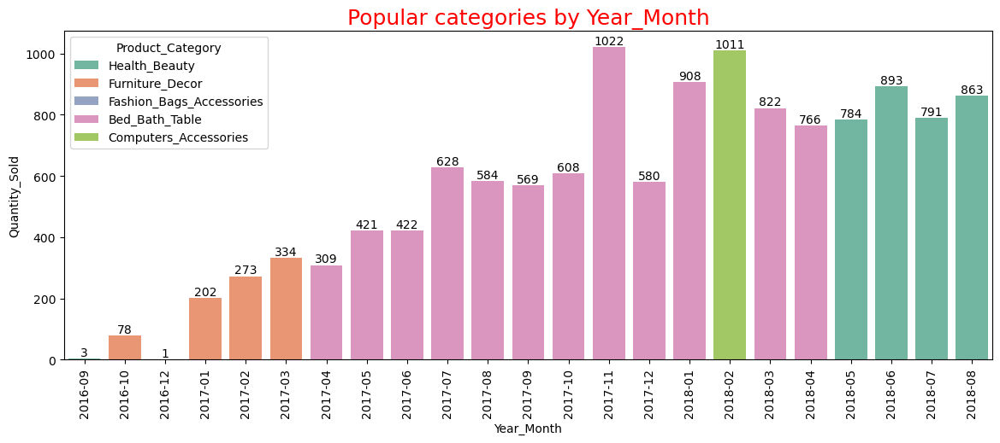

In [1278]:
plt.figure(figsize=(14,5))
ax=sns.barplot(cat_month, x= 'Year_Month' , y='Quantity_Sold', hue= 'Product_Category', palette= 'Set2')
plt.xticks(rotation=90)
plt.title('Popular categories by Year_Month', size=18, color='r')
for i in ax.containers:
    plt.bar_label(i)
plt.show()

### **The Customers into groups based on the revenue generated**

In [1699]:
bin1=[0,100,500,1000,5000,float('inf')]
label=['Low Buyers','Budget Buyers','Regular Buyers','Premium Buyers','Vip Buyers']
customer_revenue= all_order_info.groupby('customer_unique_id')[['payment_value']].sum().reset_index()
customer_revenue.columns= ['Customer_Unique_Id','Revenue']
customer_revenue['Buyer_Status']= pd.cut(customer_revenue.Revenue, bins=bin1 , labels=label)

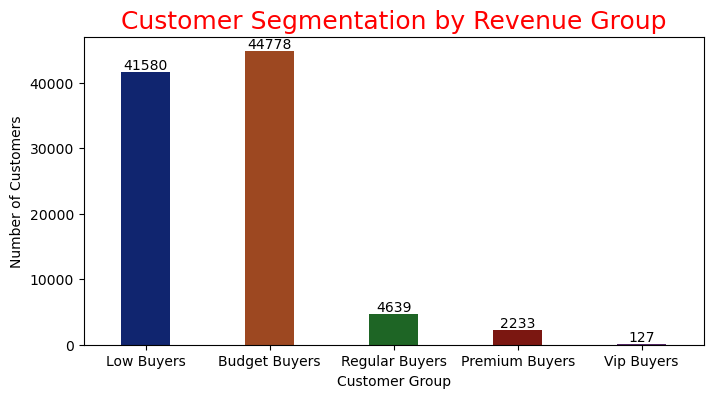

In [1701]:
plt.figure(figsize=(8,4))
ax= sns.countplot(customer_revenue, x='Buyer_Status', width=0.4 , palette='dark', hue='Buyer_Status', legend=False)
plt.title('Customer Segmentation by Revenue Group', size=18, color='r')
plt.xlabel('Customer Group')
plt.ylabel('Number of Customers')
for i in ax.containers:
    plt.bar_label(i)
plt.show()

### **The sellers into groups based on the revenue generated**

In [1501]:
bin1=[0,1000,5000,15000,35000,float('inf')]
label=['New/Inactive Seller','Emerging Seller','Growing Seller','Established Seller','Top Seller']
seller_revenue= all_order_info.groupby('seller_id')[['payment_value']].sum().reset_index()
seller_revenue.columns= ['Seller_Id','Revenue']
seller_revenue['Seller_Status']= pd.cut(seller_revenue.Revenue, bins=bin1 , labels=label)

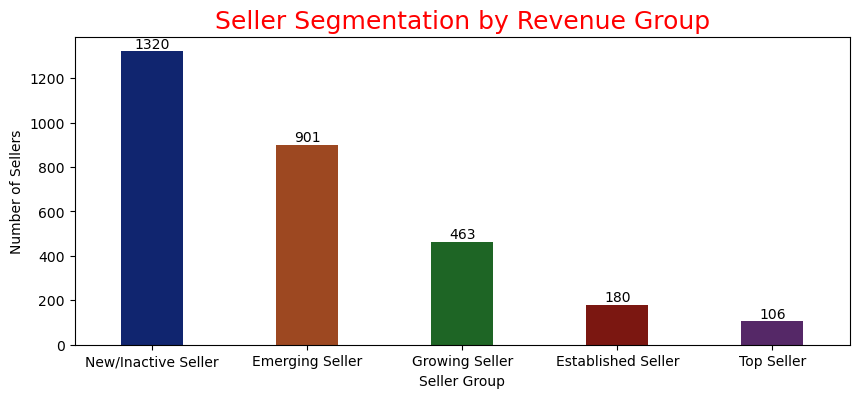

In [1503]:
plt.figure(figsize=(10,4))
ax= sns.countplot(seller_revenue, x='Seller_Status', width=0.4 , palette='dark', hue='Seller_Status', legend=False)
plt.title('Seller Segmentation by Revenue Group', size=18, color='r')
plt.xlabel('Seller Group')
plt.ylabel('Number of Sellers')
for i in ax.containers:
    plt.bar_label(i)
plt.show()

### **Cross-Selling**

In [1769]:
order_product= all_order_info.groupby('order_id')['product_id'].apply(list).reset_index()
combo_counter= Counter()
for product in order_product['product_id']:
    product= list(set(product))
    if len(product) >= 2:
        combo_counter.update(combinations(sorted(product),2))

    if len(product) > 3:
        combo_counter.update(combinations(sorted(product),3))

top_combos= pd.DataFrame(combo_counter.most_common(10), columns=['product_combo', 'frequency'])
top_combos['product_combo_names'] = top_combos['product_combo'].apply(lambda x: ', '.join(x))
#top_combos

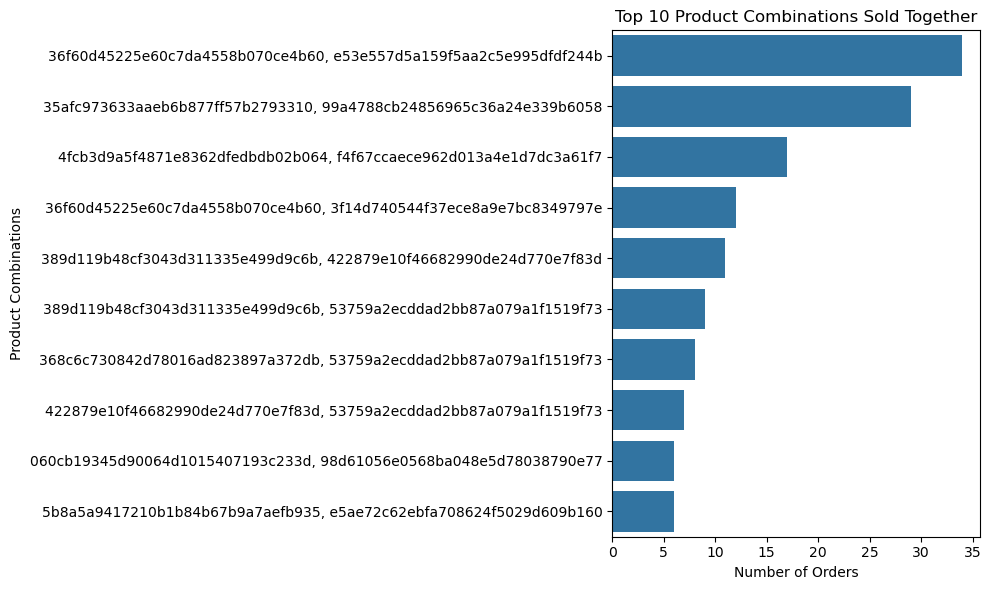

In [1582]:
plt.figure(figsize=(10,6))
sns.barplot(data=top_combos, y='product_combo_names', x='frequency')
plt.title('Top 10 Product Combinations Sold Together')
plt.xlabel('Number of Orders')
plt.ylabel('Product Combinations')
plt.tight_layout()
plt.show()

## **<center><u>RATING-Analysis</u></center>**

In [ ]:

c. Average rating by location, seller, product, category, month etc.

### **Top 10 Maximum & Minimum Rated Categories**

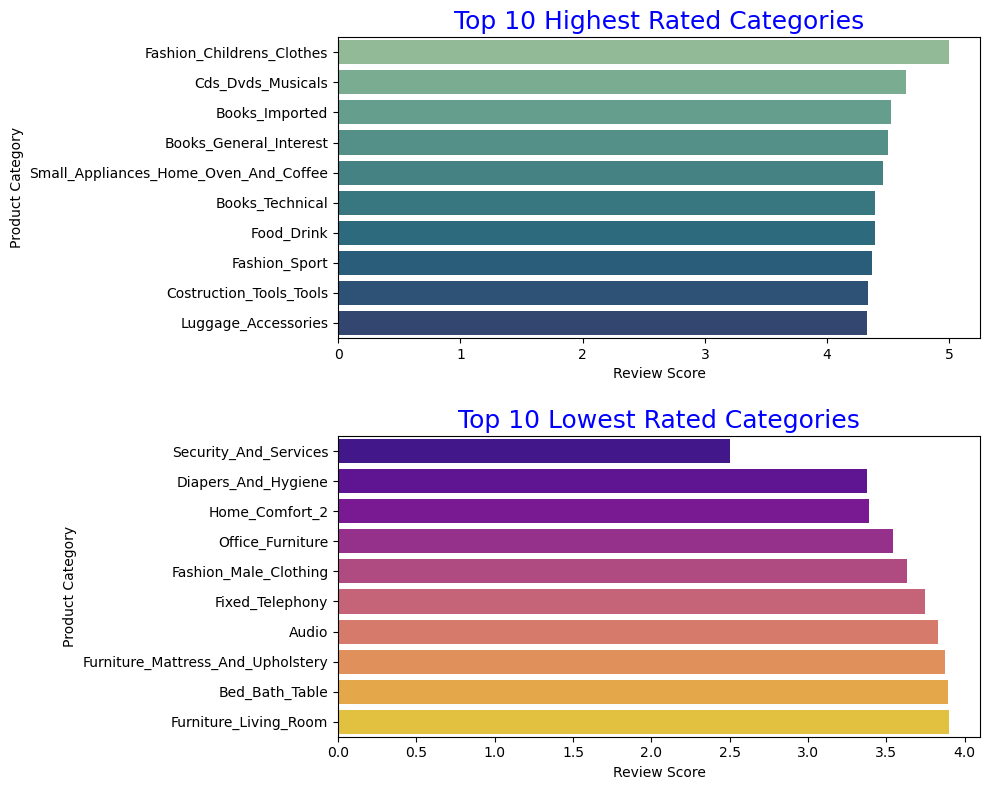

In [1940]:
max_rated_categories= all_order_info.groupby(['product_category_name'])[['review_score']].mean().sort_values('review_score',ascending= False).head(10).reset_index()
min_rated_categories= all_order_info.groupby(['product_category_name'])[['review_score']].mean().sort_values('review_score',ascending= True).head(10).reset_index()
fig, axes= plt.subplots(2,1 , figsize=(10 , 8))
sns.barplot(max_rated_categories, x='review_score', y='product_category_name', ax=axes[0], palette='crest', hue='product_category_name')
axes[0].set_title('Top 10 Highest Rated Categories', size=18 , color='b')
axes[0].set_xlabel('Review Score')
axes[0].set_ylabel('Product Category')
sns.barplot(min_rated_categories, x='review_score', y='product_category_name', ax=axes[1], palette='plasma', hue='product_category_name')
axes[1].set_title('Top 10 Lowest Rated Categories', size=18 , color='b')
axes[1].set_xlabel('Review Score')
axes[1].set_ylabel('Product Category')
plt.tight_layout(h_pad=2)
plt.show()

### **Top 10 Maximum & Minimum Rated Product**

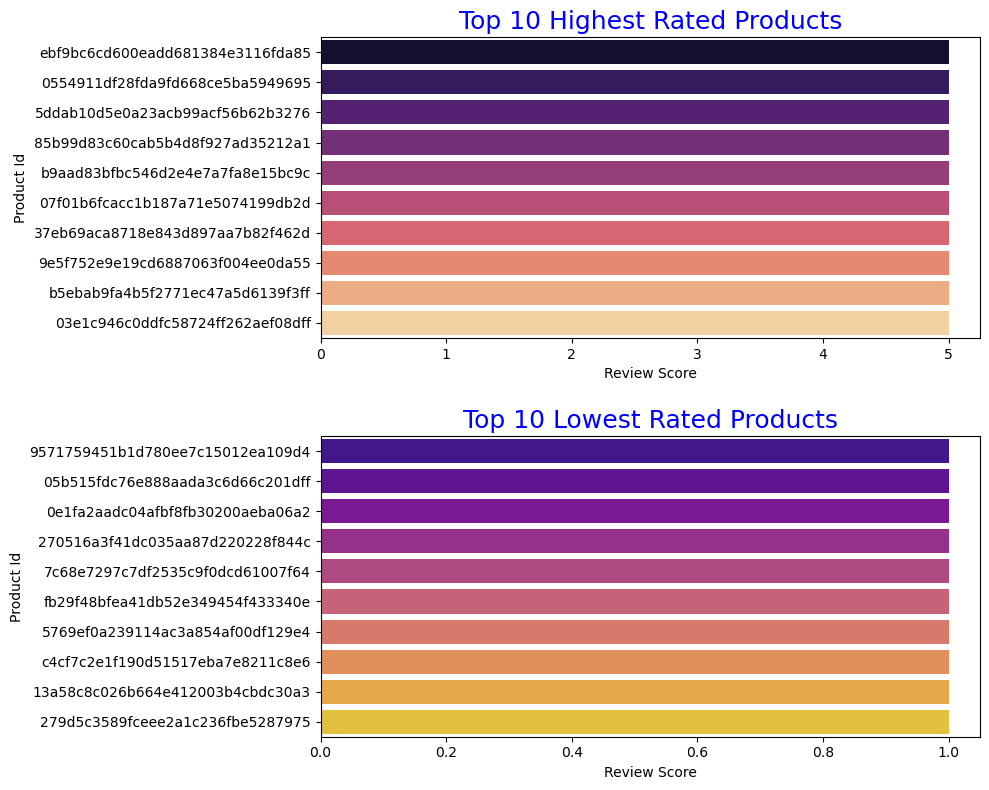

In [1942]:
max_rated_product= all_order_info.groupby(['product_id']).agg({'review_score':'mean','order_id':'count'}).sort_values(['review_score','order_id'],ascending= [False, False]).head(10).reset_index()
min_rated_product= all_order_info.groupby(['product_id']).agg({'review_score':'mean','order_id':'count'}).sort_values(['review_score','order_id'],ascending= [True, False]).head(10).reset_index()
fig, axes= plt.subplots(2,1 , figsize=(10 , 8))
sns.barplot(max_rated_product, x='review_score', y='product_id', ax=axes[0], palette='magma', hue='product_id')
axes[0].set_title('Top 10 Highest Rated Products', size=18 , color='b')
axes[0].set_xlabel('Review Score')
axes[0].set_ylabel('Product Id')
sns.barplot(min_rated_product, x='review_score', y='product_id', ax=axes[1], palette='plasma', hue='product_id')
axes[1].set_title('Top 10 Lowest Rated Products', size=18 , color='b')
axes[1].set_xlabel('Review Score')
axes[1].set_ylabel('Product Id')
plt.tight_layout(h_pad=2)
plt.show()

### **Rating by Location**

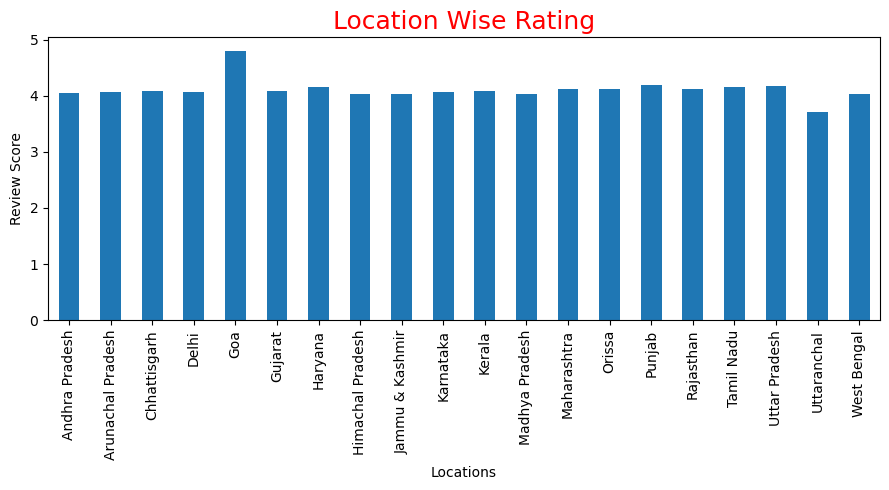

In [1908]:
loc_rating= all_order_info.groupby('customer_state')[['review_score']].mean()
loc_rating.plot(kind='bar' , legend=False, figsize=(9,5) )
plt.title('Location Wise Rating', size=18, color='r')
plt.xlabel('Locations')
plt.ylabel('Review Score')
plt.tight_layout()
plt.show()

### **Top 10 Maximum & Minimum Rated Seller**

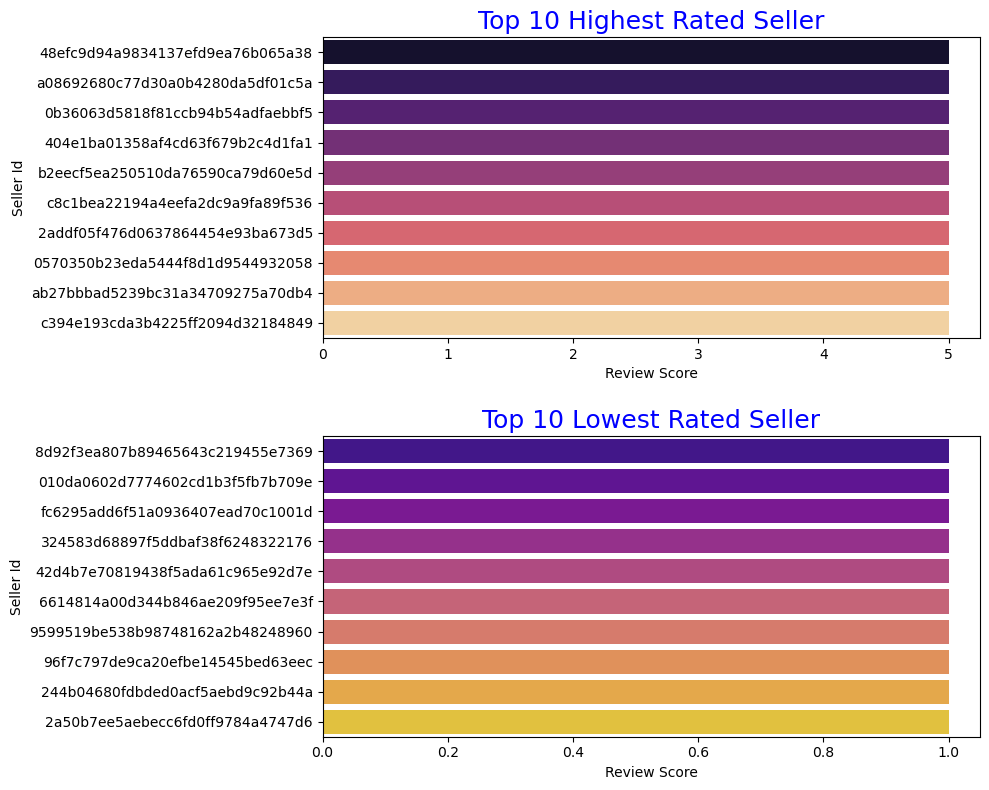

In [1944]:
max_rated_seller= all_order_info.groupby(['seller_id']).agg({'review_score':'mean','order_id':'count'}).sort_values(['review_score','order_id'],ascending= [False, False]).head(10).reset_index()
min_rated_seller= all_order_info.groupby(['seller_id']).agg({'review_score':'mean','order_id':'count'}).sort_values(['review_score','order_id'],ascending= [True, False]).head(10).reset_index()
fig, axes= plt.subplots(2,1 , figsize=(10 , 8))
sns.barplot(max_rated_seller, x='review_score', y='seller_id', ax=axes[0], palette='magma', hue='seller_id')
axes[0].set_title('Top 10 Highest Rated Seller', size=18 , color='b')
axes[0].set_xlabel('Review Score')
axes[0].set_ylabel('Seller Id')
sns.barplot(min_rated_seller, x='review_score', y='seller_id', ax=axes[1], palette='plasma', hue='seller_id')
axes[1].set_title('Top 10 Lowest Rated Seller', size=18 , color='b')
axes[1].set_xlabel('Review Score')
axes[1].set_ylabel('Seller Id')
plt.tight_layout(h_pad=2)
plt.show()

### **Rating by Months**

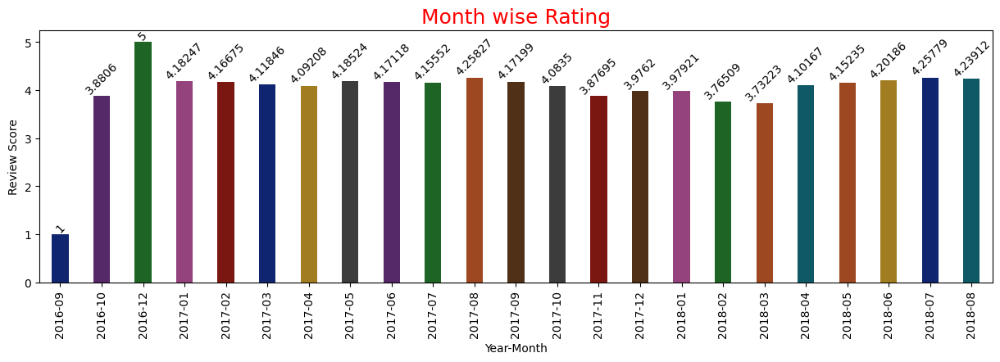

In [1938]:
month_rating= all_order_info.groupby(['year_month'])[['review_score']].mean().reset_index()
plt.figure(figsize=(15,4))
ax= sns.barplot(month_rating, x='year_month', y='review_score', width=0.4 , palette='dark', hue='review_score', legend=False)
plt.title('Month wise Rating', size=18, color='r')
plt.xlabel('Year-Month')
plt.ylabel('Review Score')
plt.xticks(rotation=90)
for i in ax.containers:
    plt.bar_label(i, rotation=45 )
plt.show()